In [1]:
from datetime import datetime

print(f"Timestamp: {datetime.now()}")

Timestamp: 2026-01-27 14:27:17.540999


In [2]:
from pathlib import Path
import sys
import os
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.colors as clr
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as plt
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import seaborn as sns

In [3]:
from pathlib import Path
import sys
import os
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.colors as clr
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

from matplotlib.colors import Normalize
import matplotlib.cm as cm
import seaborn as sns

In [4]:
# plt.rcdefaults()

In [5]:
# plt.rcParams['figure.figsize'] = (4,4)
plt.rcParams['figure.figsize'] = (3,3)
plt.rcParams["figure.dpi"] = 300

In [6]:
# make text editable as words in output plots
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [7]:
sys.path.append(str(Path.cwd().resolve().parents[1]))

base_dir = "/home/workspace/DRG"
data_dir = "sc-spatial-gpu-ide_transer/projects/20260115_drg-gpu-backup"

input_dir = os.path.join(base_dir, data_dir, "data/h5ad/export_04/04c_gamma_subtypes")
output_dir = os.path.join(base_dir, "spatial_mouse_drg_outputs/Kim")

plot_out_dir = os.path.join(output_dir, "plots")
if not os.path.exists (plot_out_dir):
    os.makedirs(plot_out_dir)
    
# input_file =os.path.join(input_dir, "neurons-final-labels.h5ad")
input_file = "/home/workspace/DRG/sc-spatial-gpu_ide_transfer/projects/20260115_drg-gpu-backup/data/h5ad/export_04/04c_gamma_subtypes/neurons-final-labels.h5ad"

# currently unable to locate this reference file
input_file_ref = "/home/workspace/DRG/MC_private_folder/home/workspace/private/projects/kim/drg/data/scrna-seq/h5ad/04_clustered/GSE139088-scvi-leiden.h5ad"

# adata_ref 480 used for gaussian figure
adata_480_path = "/home/workspace/DRG/sc-spatial-gpu_ide_transfer/projects/20260115_drg-gpu-backup/data/h5ad/export_02/02b_leiden/adata-leiden-480.h5ad"


In [8]:
adata_480 = sc.read_h5ad(adata_480_path)

In [9]:
adata_480

AnnData object with n_obs × n_vars = 147036 × 480
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'output_id', 'region_id', 'slide_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'batch', '_scvi_batch', '_scvi_labels', 'leiden_scVI_1'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'leiden_scVI_1', 'leiden_scVI_1_colors', 'neighbors', 'sample_id_colors', 'slide_id_colors', 'umap'
    obsm: 'X_scVI_ModelB_480', 'X_umap', 'spatial'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [10]:
adata = sc.read_h5ad(input_file)
adata

AnnData object with n_obs × n_vars = 22411 × 475
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'output_id', 'region_id', 'slide_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'batch', '_scvi_batch', '_scvi_labels', 'leiden_scVI_1', 'scanvi_labels', 'seurat_labels', 'prediction.score.CGRP.Theta', 'prediction.score.CGRP.Gamma', 'prediction.score.CGRP.Alpha', 'prediction.score.Nonpeptidergic.nociceptors', 'prediction.score.C.LTMR', 'prediction.score.Sst', 'prediction.score.CGRP.Zeta', 'prediction.score.CGRP.Epsilion', 'prediction.score.Proprioceptors', 'prediction.score.Unknown', 'predicti

In [11]:
adata_reference = sc.read_h5ad(input_file_ref)
adata_reference

AnnData object with n_obs × n_vars = 10729 × 20924
    obs: 'original_annotation', 'GSE', 'GSM', 'sample_number', 'sample_id', 'experiment_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribosomal', 'pct_counts_ribosomal', 'doublet_scores', 'predicted_doublets', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'mt', 'ribosomal', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'original_annotation_colors', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts', 'log1p', 'normalized_1e6'
    obsp: 'connectivities', 'distances'

## Plotting functions

In [12]:
import matplotlib.pyplot as plt

def plot_umaps(
    adata,
    label_cols,
    true_color_map,
    false_color,
    true_size,
    false_size,
    edgecolor,
    linewidth,
    alpha_false,
    alpha_true,
    figsize=(3, 3),
    save_path  = None
):
    """
    Plot minimalist UMAPs for boolean label columns.
    No title, no axes, no border.
    """

    if "X_umap" not in adata.obsm:
        raise ValueError("No UMAP found in adata.obsm['X_umap'].")

    x, y = adata.obsm["X_umap"][:, 0], adata.obsm["X_umap"][:, 1]

    for col in label_cols:
        if col not in adata.obs.columns:
            print(f"Column `{col}` not in adata.obs — skipping.")
            continue

        if col not in true_color_map:
            raise ValueError(f"Missing true_color_map entry for `{col}`.")

        true_color = true_color_map[col]
        mask = adata.obs[col].astype(bool).values

        plt.figure(figsize=figsize)

        # Plot FALSE background
        plt.scatter(
            x[~mask],
            y[~mask],
            s=false_size,
            c=false_color,
            linewidths=0,
            alpha=alpha_false,
        )

        # Plot TRUE foreground
        plt.scatter(
            x[mask],
            y[mask],
            s=true_size,
            c=true_color,
            linewidths=linewidth,
            edgecolors=edgecolor,
            alpha=alpha_true,
        )

        ax = plt.gca()
        ax.set_aspect("equal", "box")

        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel("")
        ax.set_ylabel("")
        ax.set_title("")  # remove title
        ax.spines["top"].set_visible(False)
        ax.spines["bottom"].set_visible(False)
        ax.spines["left"].set_visible(False)
        ax.spines["right"].set_visible(False)

        plt.tight_layout()

        if save_path is not None:
            plt.savefig(os.path.join(save_path, f"umap_{col}.pdf"), format='pdf', bbox_inches='tight')

        plt.show()

In [13]:
def barplot_dual_distribution(
    adata,
    population_name,
    group_col="neuron_labels",
    dual_col="EGFP_dTomato_dual_hi",
    bar_color="black",
    figsize=(4, 4),
    fontsize=11,
    plot_counts = True,
    return_group_order=False,
    group_order=None,
):
    df = adata.obs[[group_col, dual_col]].copy()
    df[dual_col] = df[dual_col].astype(bool)
    df[group_col] = df[group_col].astype(str).replace("nan", "Unknown")

    # Count dual positives per group (correct)
    dual_counts = df.groupby(group_col)[dual_col].sum()

    total_dual = dual_counts.sum()
    print('number +: ', total_dual)

    # percentage
    stats = (dual_counts / total_dual * 100).sort_values(ascending=False)

    if group_order is not None:
        # Use the provided order. .reindex ensures we handle missing/extra groups safely.
        # Fill missing groups with 0 so the bars show up as empty instead of crashing.
        stats = stats.reindex(group_order).fillna(0)
    else:
        # Default: Sort by percentage descending
        stats = stats.sort_values(ascending=False)
    
    # Final order of categories
    final_order = stats.index.tolist()
    sorted_counts = dual_counts.reindex(final_order).fillna(0)

    # # ordered counts
    # sorted_counts = dual_counts.loc[stats.index]

    fig, ax = plt.subplots(figsize=figsize)

    x = np.arange(len(stats))
    if plot_counts:
        ax.bar(x, sorted_counts.values, color=bar_color, alpha=0.9)
    else:
        ax.bar(x, stats.values, color=bar_color, alpha=0.9)

    # xticks
    ax.set_xticks(x)
    ax.set_xticklabels(stats.index, rotation=45, ha="right", fontsize=fontsize)

    # y-axis
    if plot_counts:
        ax.set_ylabel("Count", fontsize=fontsize)
    else:     
        ax.set_ylim(0, 100)  # <-- force axis to show full 0–100%
        ax.set_ylabel(f"% of {population_name} \nneurons", fontsize=fontsize)
    ax.set_xlabel("")

    # minimalist styling
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="y", length=0)
    ax.tick_params(axis="x", length=0)

    plt.subplots_adjust(bottom=0.28)
    if return_group_order:
        return fig, final_order
    return fig

## Confirm key aspects of processed dataset

In [14]:
# neurons where thresholded at 1000 transcripts/cell
min(adata.obs['total_counts'])

1000.0

## Check Umaps

### Xenium

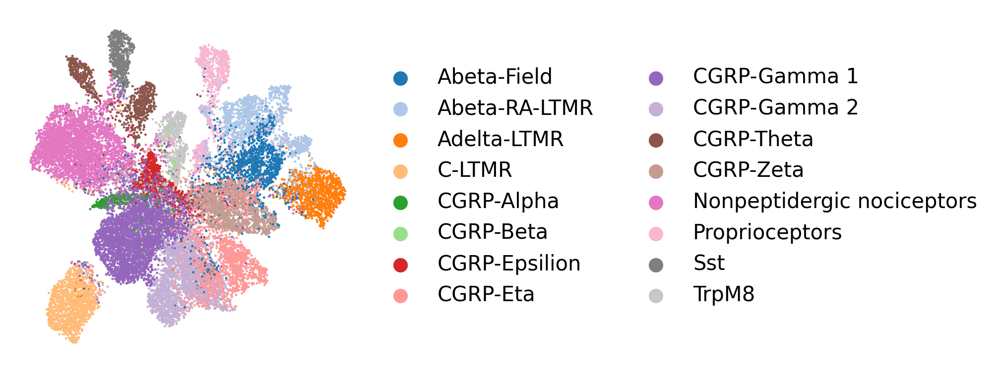

In [15]:
sc.pl.embedding(adata, basis = 'X_umap', color = 'neuron_label', title = '', frameon=False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"umap_neuron_label.pdf"), format='pdf', bbox_inches='tight')

### Ginty reference

In [16]:
import matplotlib.colors as mcolors
def assign_cell_type_colors(adata, key="cell_type"):
    """Assigns a HUSL color palette to a categorical obs field."""
    adata.obs[key] = adata.obs[key].astype("category")
    num_categories = len(adata.obs[key].cat.categories)

    palette = sns.color_palette("tab20", n_colors=num_categories)
    adata.uns[f"{key}_colors"] = [mcolors.to_hex(c) for c in palette]

    print(f"Assigned {num_categories} HUSL colors for `{key}`.")

assign_cell_type_colors(adata_reference, key="original_annotation")

Assigned 16 HUSL colors for `original_annotation`.


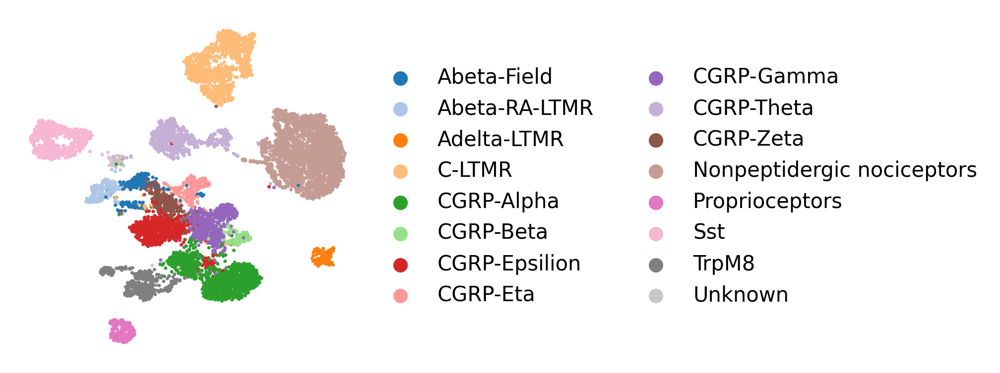

In [17]:
sc.pl.embedding(adata_reference, basis = 'X_umap', color = 'original_annotation', title = '', frameon=False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"umap_ginty_label.pdf"), format='pdf', bbox_inches='tight')

In [18]:
labels = ["EGFP_Seq1_hi", "dTomato_Seq2_hi", "EGFP_dTomato_dual_hi"]

true_color_map = {
    "EGFP_Seq1_hi": "limegreen",
    "dTomato_Seq2_hi": "magenta",
    "EGFP_dTomato_dual_hi": "blue",
}

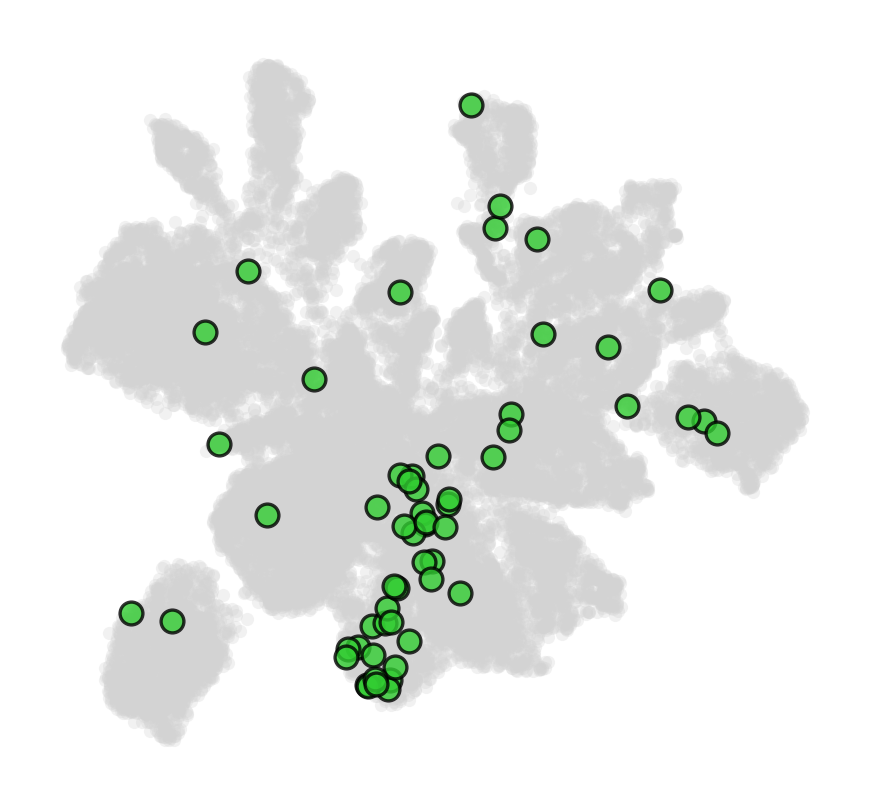

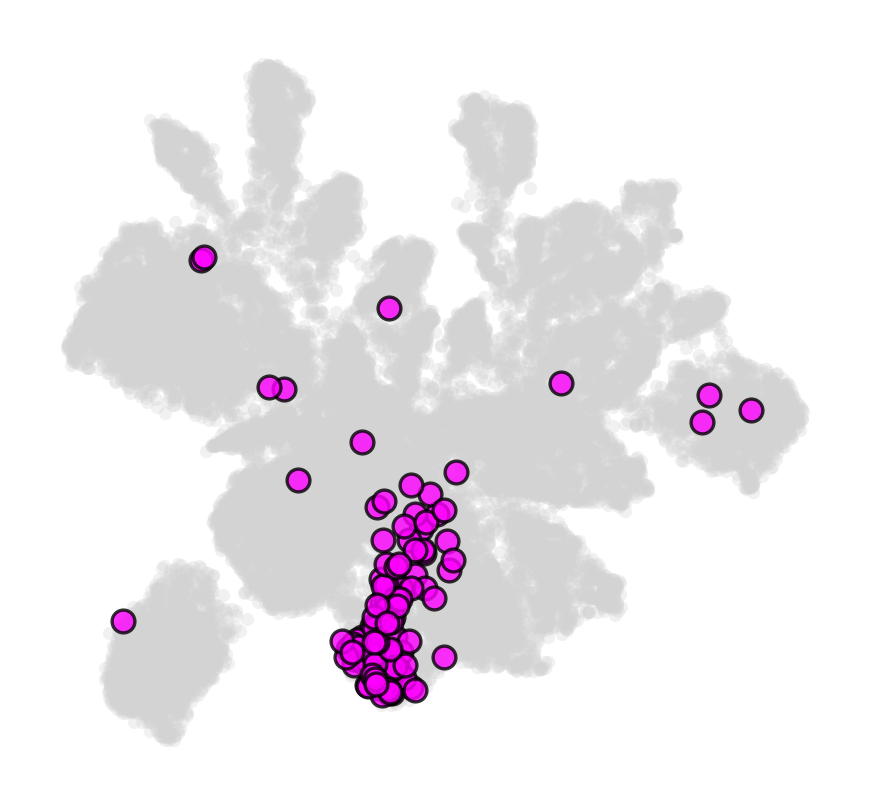

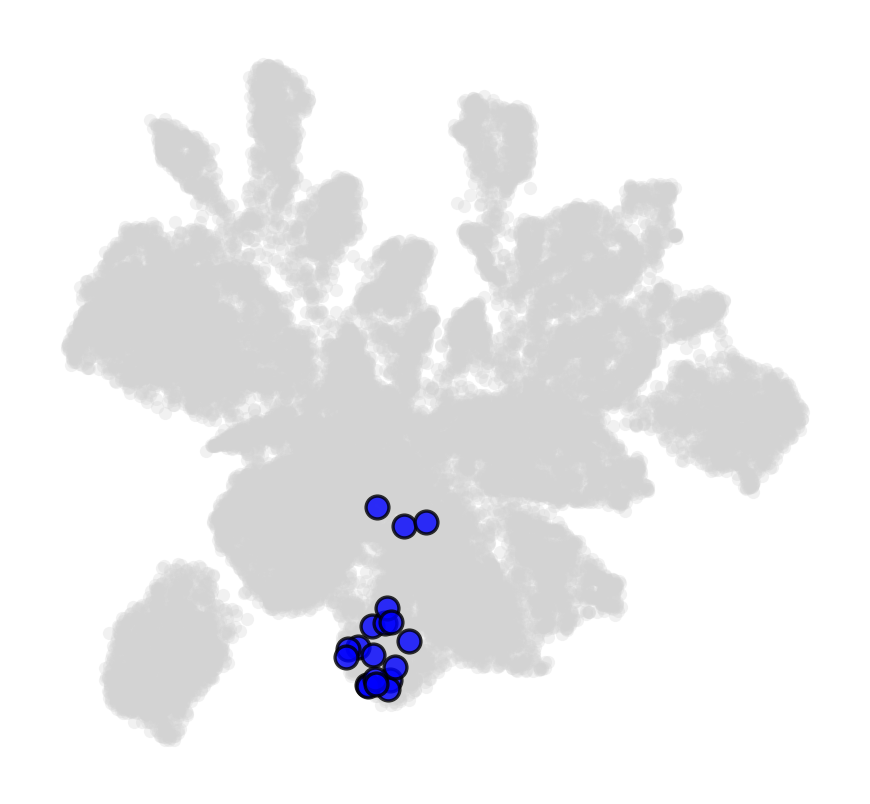

In [19]:
plot_umaps(
    adata,
    label_cols=labels,
    true_color_map=true_color_map,
    false_color="lightgray",
    true_size=30,
    false_size=10,
    edgecolor="black",
    linewidth=0.8,
    alpha_false=0.3,
    alpha_true=0.8,
    save_path = plot_out_dir
)

## Check reporter status and bar plots

In [47]:
group_col = 'neuron_label'
dual_col = 'EGFP_Seq1_hi'
# output 
df = adata.obs[[group_col, dual_col]].copy()
df[dual_col] = df[dual_col].astype(bool)
df[group_col] = df[group_col].astype(str).replace("nan", "Unknown")

# Count dual positives per group (correct)
dual_counts = df.groupby(group_col)[dual_col].sum()

total_dual = dual_counts.sum()
print('number +: ', total_dual)

# percentage
stats = (dual_counts / total_dual * 100).sort_values(ascending=False)

count_percent_df = pd.concat([dual_counts, stats], axis=1)
count_percent_df.columns = ['count', 'percent']
count_percent_df = count_percent_df.sort_values(by='percent', ascending=False)
count_percent_df

number +:  58


,count,percent
neuron_label,,
CGRP-Gamma 2,28,48.275862
CGRP-Gamma 1,7,12.068966
Abeta-RA-LTMR,3,5.172414
CGRP-Eta,3,5.172414
Proprioceptors,3,5.172414
Abeta-Field,2,3.448276
Adelta-LTMR,2,3.448276
C-LTMR,2,3.448276
CGRP-Zeta,2,3.448276


In [20]:
# Show single+ all together
counts_series = adata.obs.value_counts(['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi'])
counts_df = counts_series.reset_index(name='cell_count')
counts_df

,EGFP_Seq1_hi,dTomato_Seq2_hi,EGFP_dTomato_dual_hi,cell_count
0,False,False,False,22264
1,False,True,False,89
2,True,False,False,39
3,True,True,True,19


In [21]:
adata.obs['reporter_status'].unique().tolist()

['Negative', 'dTomato_Seq2_hi', 'EGFP_Seq1_hi', 'EGFP_dTomato_dual_hi']

In [22]:
counts = adata.obs.value_counts(['reporter_status'])
counts

reporter_status     
Negative                22264
dTomato_Seq2_hi            89
EGFP_Seq1_hi               39
EGFP_dTomato_dual_hi       19
Name: count, dtype: int64

In [23]:
counts = adata.obs.value_counts(['EGFP_Seq1_hi'])
counts

EGFP_Seq1_hi
False           22353
True               58
Name: count, dtype: int64

In [24]:
counts = adata.obs.value_counts(['dTomato_Seq2_hi'])
counts

dTomato_Seq2_hi
False              22303
True                 108
Name: count, dtype: int64

In [25]:
counts = adata.obs.value_counts(['EGFP_dTomato_dual_hi'])
counts

EGFP_dTomato_dual_hi
False                   22392
True                       19
Name: count, dtype: int64

### Export reporter status counts as csv
We will make four versions of these csvs
1. Counts of reporter positive cells where the EGFP+ and dTomato+ counts are not single positive (e.g. they include that dual+ cells)
2. Counts of reporter positive cells where the EGFP+ and dTomato+ counts are single positive
3. For each of these 2 options, generate the table first with counts separated by cell type and then collapsed to combine all cell types

### Csvs for single positives
Use, 'reporter status' column, which already contains single+ and dual+

In [26]:
# counts by neuron label
combined_counts = adata.obs.value_counts(['neuron_label', 'reporter_status'])

combined_df = combined_counts.reset_index(name='cell_count')

# # 3. Apply your rename_map to the reporter_status column
# combined_df['reporter_status'] = combined_df['reporter_status'].map(rename_map)

# Sort for better readability (Group by neuron, then descending count)
combined_df = combined_df.sort_values(['neuron_label', 'cell_count'], ascending=[True, False])

# now collapse cell types
combined_df_collapse = combined_df.groupby('reporter_status')['cell_count'].sum().reset_index().sort_values(by='cell_count', ascending=False)

# Export
combined_df.to_csv(os.path.join(output_dir, 'neuron_label_reporter_status_single_positive.csv'), index=False)
combined_df_collapse.to_csv(os.path.join(output_dir, 'all_neurons_reporter_status_single_positive.csv'), index=False)

/tmp/ipykernel_216/4004220602.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  combined_df_collapse = combined_df.groupby('reporter_status')['cell_count'].sum().reset_index().sort_values(by='cell_count', ascending=False)


In [27]:
combined_df

,neuron_label,reporter_status,cell_count
6,Abeta-Field,Negative,1449
29,Abeta-Field,EGFP_Seq1_hi,2
38,Abeta-Field,dTomato_Seq2_hi,1
5,Abeta-RA-LTMR,Negative,1460
23,Abeta-RA-LTMR,EGFP_Seq1_hi,3
8,Adelta-LTMR,Negative,1014
22,Adelta-LTMR,dTomato_Seq2_hi,4
28,Adelta-LTMR,EGFP_Seq1_hi,2
7,C-LTMR,Negative,1399
31,C-LTMR,EGFP_Seq1_hi,2


In [28]:
combined_df_collapse

,reporter_status,cell_count
2,Negative,22264
3,dTomato_Seq2_hi,89
0,EGFP_Seq1_hi,39
1,EGFP_dTomato_dual_hi,19


### Csvs for all reporter positives (not requiring single positive)

Use the individual reporter True/False columns for counting

In [29]:
# counts by neuron label
single_reporter_cols = ['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi']
combined_counts = adata.obs.groupby('neuron_label')[single_reporter_cols].sum()
is_negative = adata.obs[single_reporter_cols].sum(axis=1) == 0
combined_counts['Negative'] = adata.obs[is_negative].groupby('neuron_label').size()


# Reshape from "Wide" to "Long" format 
combined_df = combined_counts.stack().reset_index()

# relabel columns
combined_df.columns = ['neuron_label', 'reporter_status', 'cell_count']

# sort
combined_df = combined_df.sort_values(['neuron_label', 'cell_count'], ascending=[True, False])

# now collapse cell types
combined_df_collapse = combined_df.groupby('reporter_status')['cell_count'].sum().reset_index().sort_values(by='cell_count', ascending=False)

# Export
combined_df.to_csv(os.path.join(output_dir, 'neuron_label_reporter_status_not_single_positive.csv'), index=False)
combined_df_collapse.to_csv(os.path.join(output_dir, 'all_neurons_reporter_status_not_single_positive.csv'), index=False)

/tmp/ipykernel_216/3776613712.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  combined_counts = adata.obs.groupby('neuron_label')[single_reporter_cols].sum()
/tmp/ipykernel_216/3776613712.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  combined_counts['Negative'] = adata.obs[is_negative].groupby('neuron_label').size()


In [30]:
combined_df

,neuron_label,reporter_status,cell_count
3,Abeta-Field,Negative,1449
0,Abeta-Field,EGFP_Seq1_hi,2
1,Abeta-Field,dTomato_Seq2_hi,1
2,Abeta-Field,EGFP_dTomato_dual_hi,0
7,Abeta-RA-LTMR,Negative,1460
...,...,...,...
58,Sst,EGFP_dTomato_dual_hi,0
63,TrpM8,Negative,648
60,TrpM8,EGFP_Seq1_hi,2
61,TrpM8,dTomato_Seq2_hi,0


In [31]:
combined_df_collapse

,reporter_status,cell_count
2,Negative,22264
3,dTomato_Seq2_hi,108
0,EGFP_Seq1_hi,58
1,EGFP_dTomato_dual_hi,19


### Plot reporter status barplots

### Counts - showing reporter+ (not necessarily single positive)

number +:  19
number +:  58
number +:  108


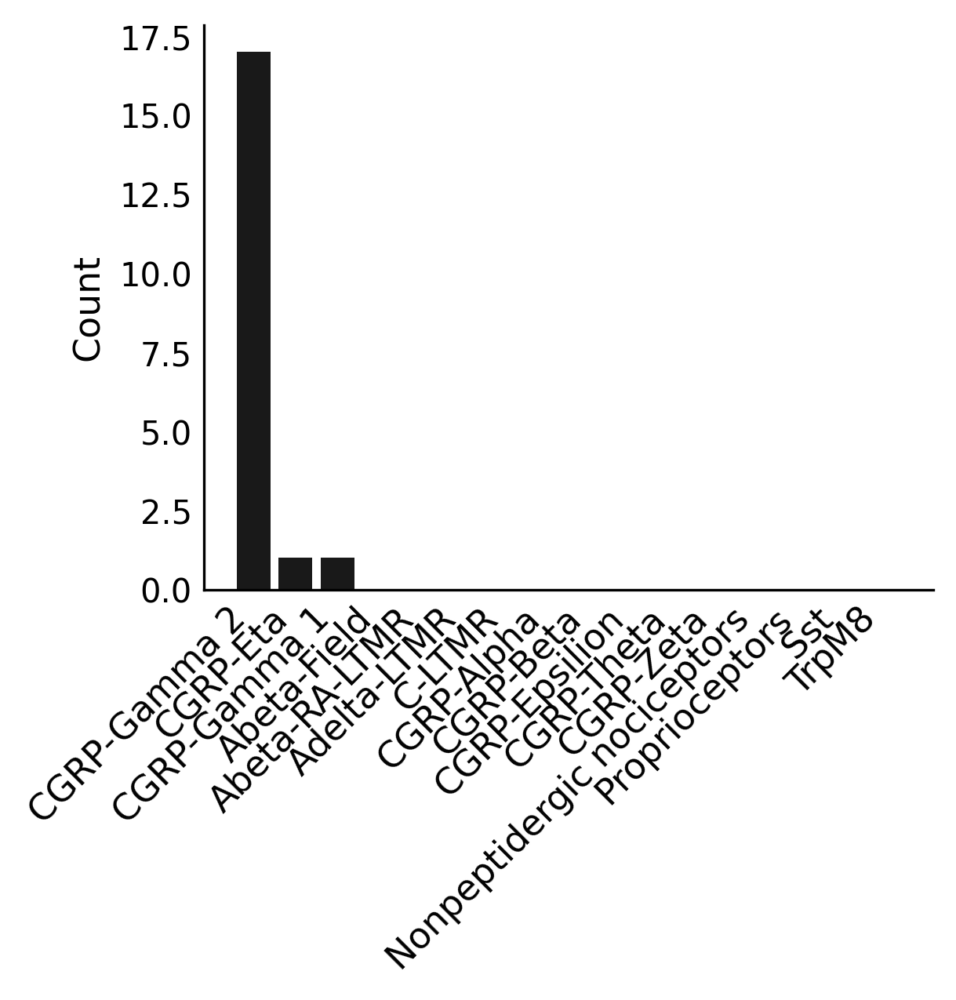

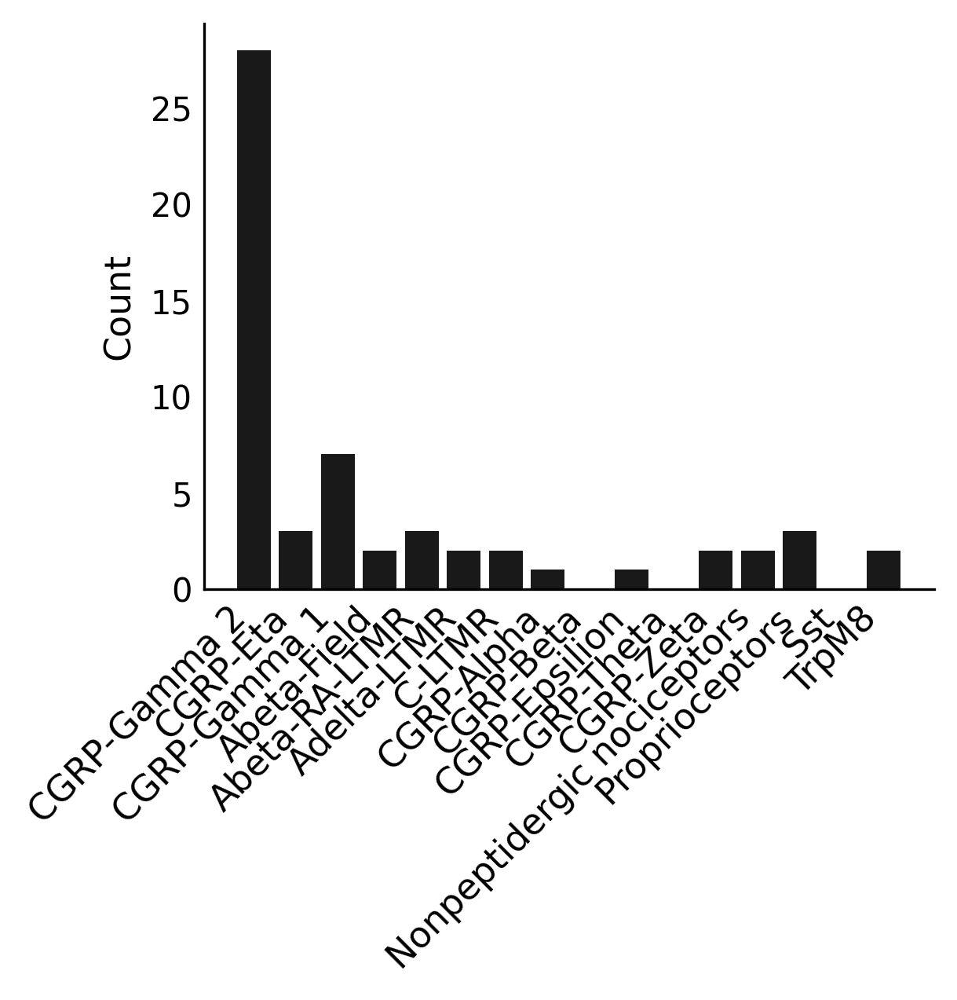

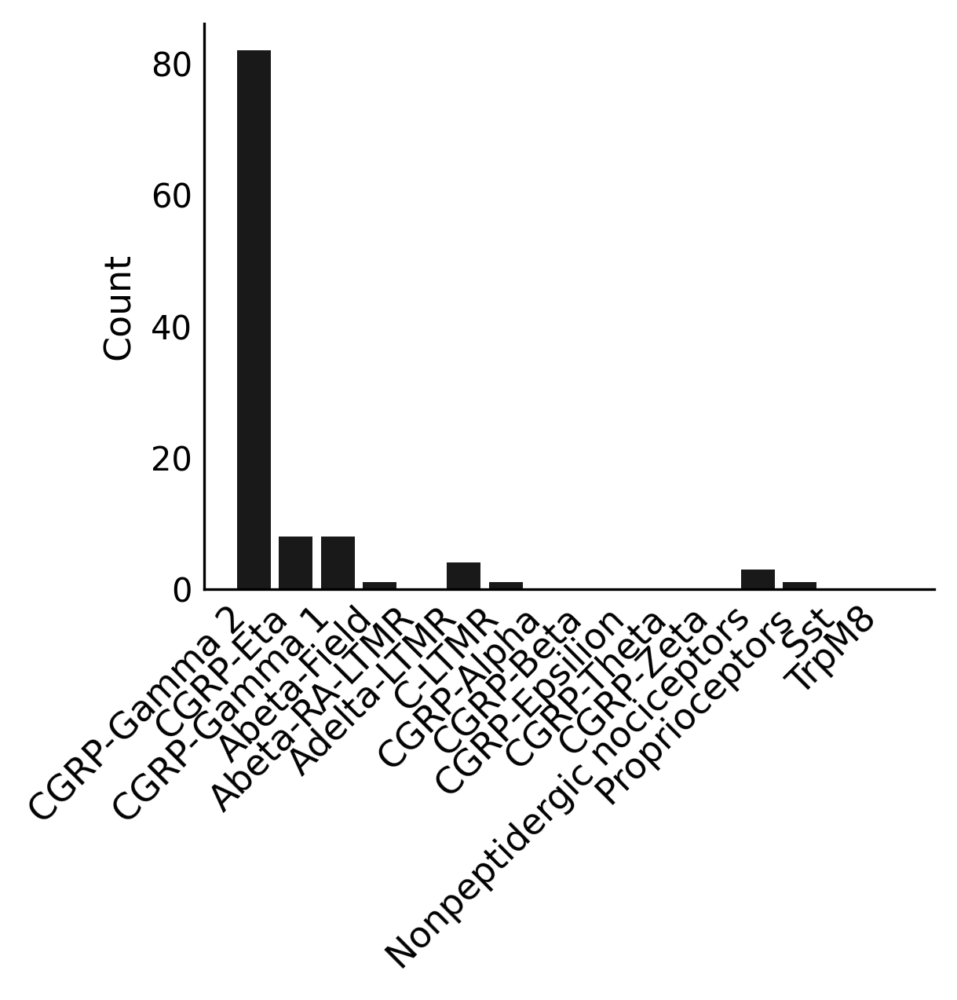

In [32]:
# set cell type order based on dual positive order
_, dual_order = barplot_dual_distribution(adata, population_name = 'Double+',
                                          dual_col="EGFP_dTomato_dual_hi",
                          return_group_order=True,
                            group_order=None)   
plt.savefig(os.path.join(plot_out_dir, "dual_distribution_count.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata,population_name = 'EGFP+',
                          dual_col="EGFP_Seq1_hi",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_count.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata,population_name = 'dTomato+',
                          dual_col="dTomato_Seq2_hi",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_count.pdf"), format='pdf', bbox_inches='tight')



### Counts - showing single positive only for each single reporter

number +:  39
number +:  89


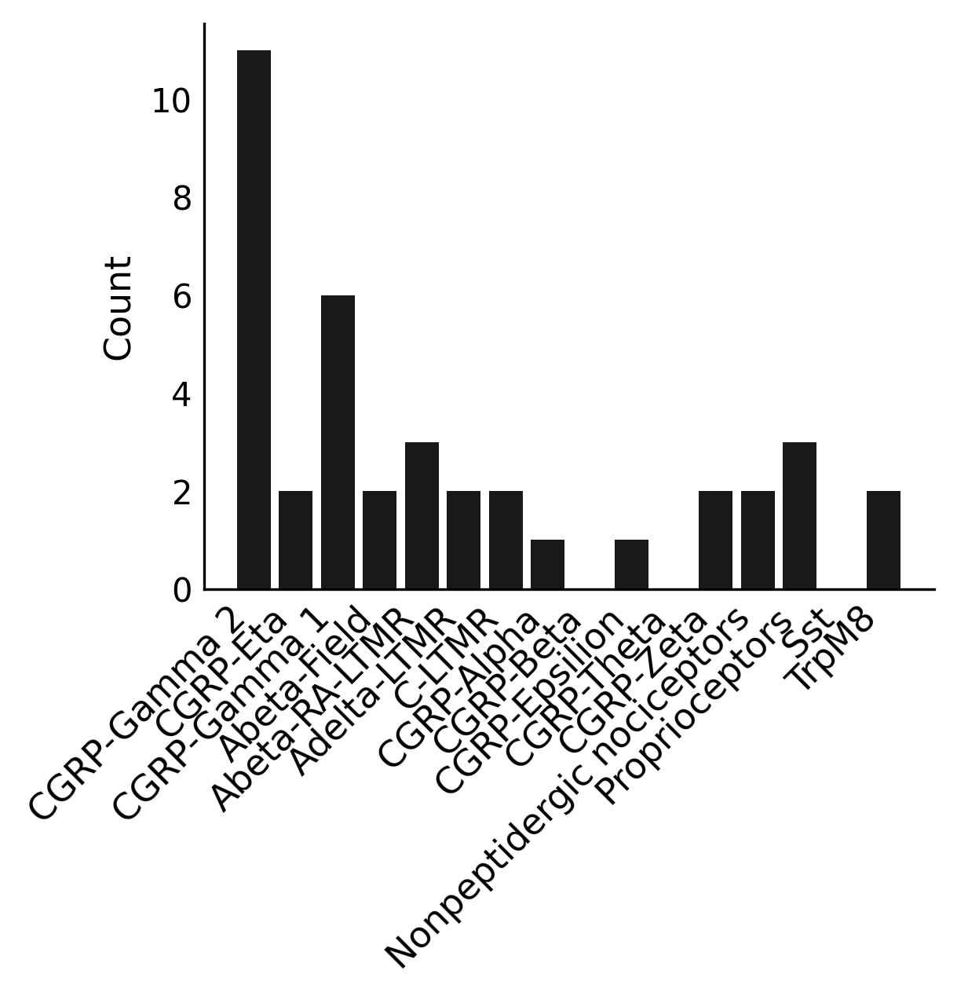

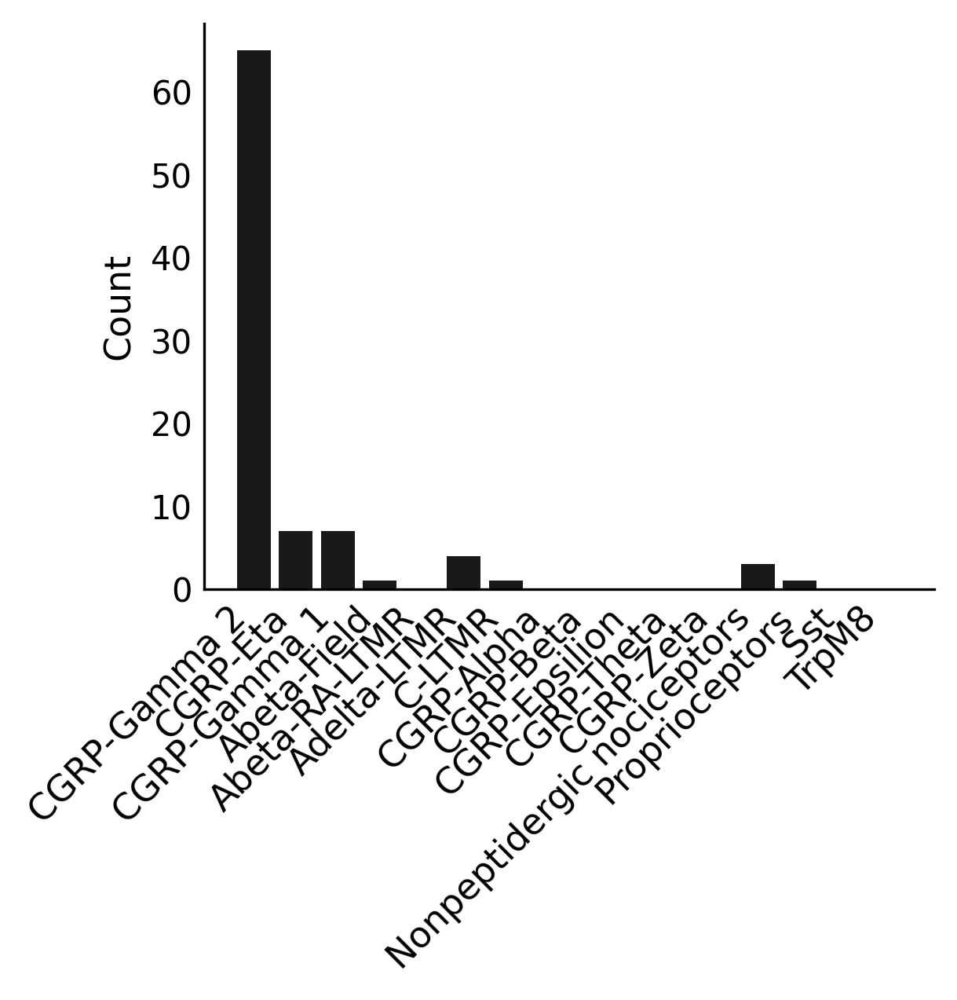

In [33]:
# set cell type order based on dual positive order

# make new temporary column 
tmp = adata.copy()
tmp.obs['EGFP_single_positive'] = False
tmp.obs['dTomato_single_positive'] = False
tmp.obs.loc[tmp.obs['reporter_status']=='EGFP_Seq1_hi', 'EGFP_single_positive'] = True
tmp.obs.loc[tmp.obs['reporter_status']=='dTomato_Seq2_hi', 'dTomato_single_positive'] = True

barplot_dual_distribution(tmp,population_name = 'EGFP+',
                          dual_col="EGFP_single_positive",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_count_single_positive.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(tmp,population_name = 'dTomato+',
                          dual_col="dTomato_single_positive",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_count_single_positive.pdf"), format='pdf', bbox_inches='tight')



### Percent - showing reporter+ (not single positive)

number +:  19
number +:  58
number +:  108


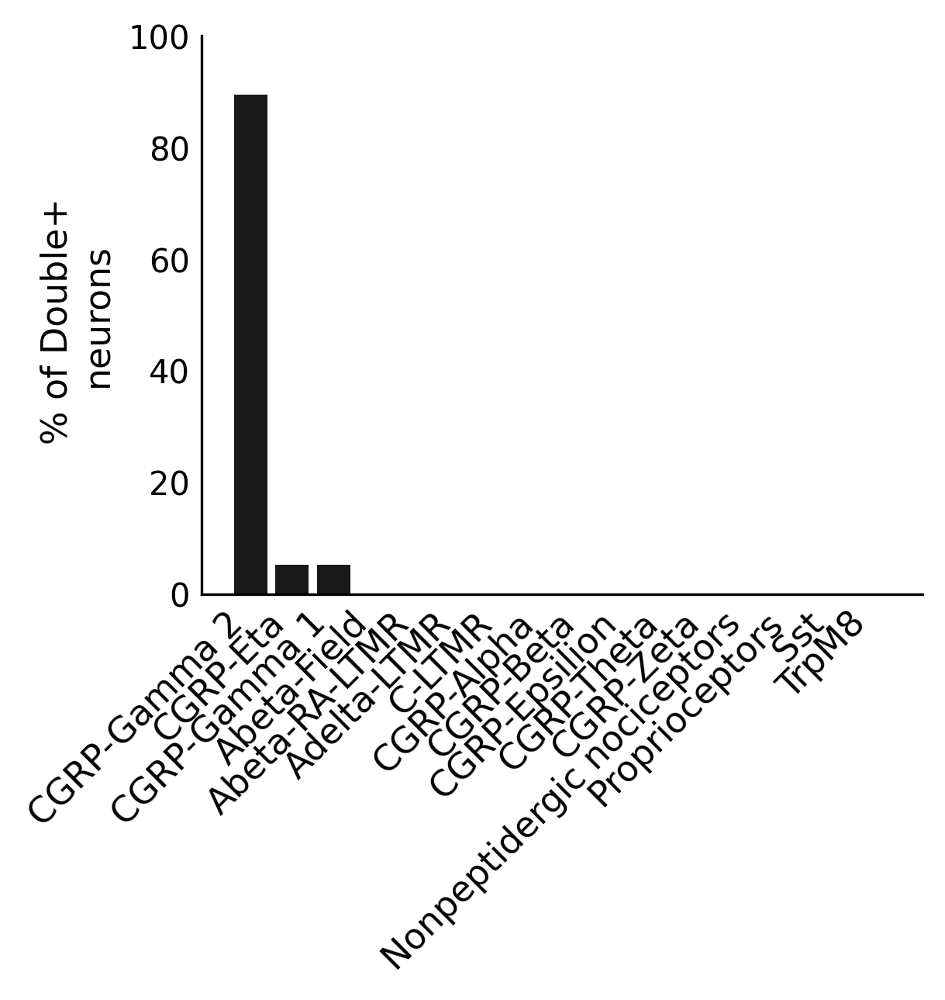

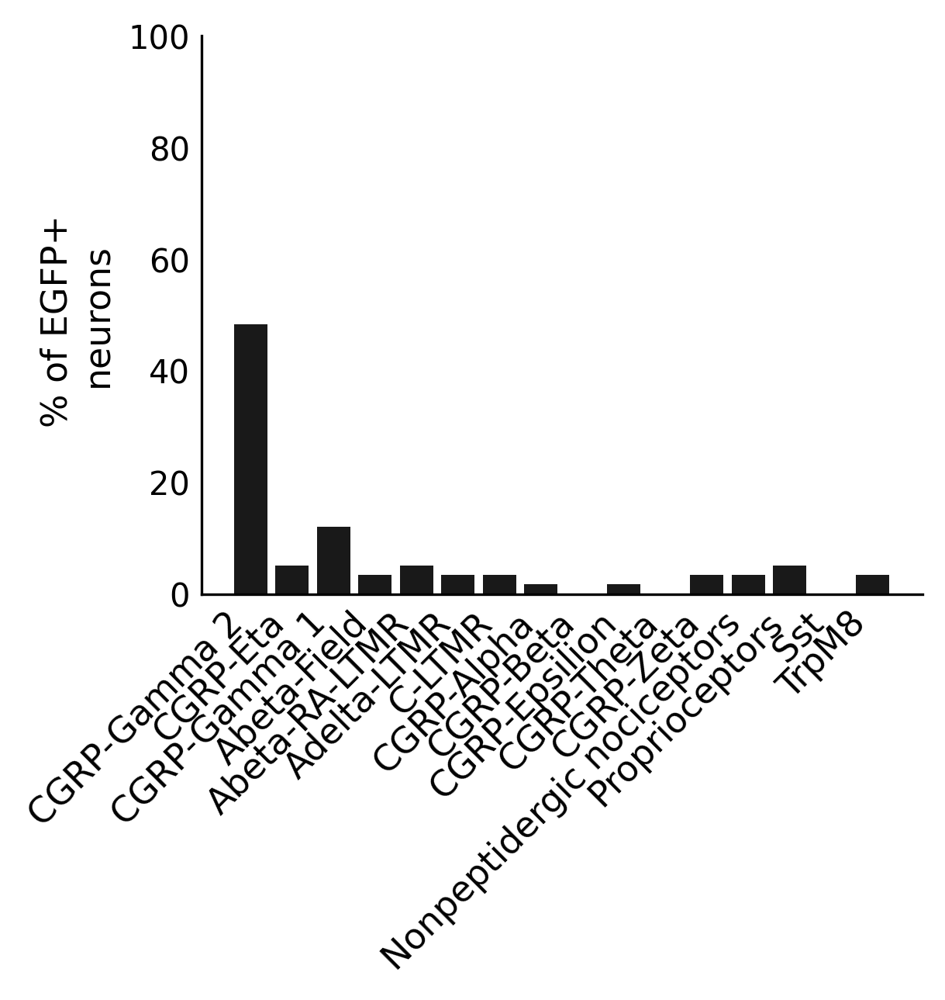

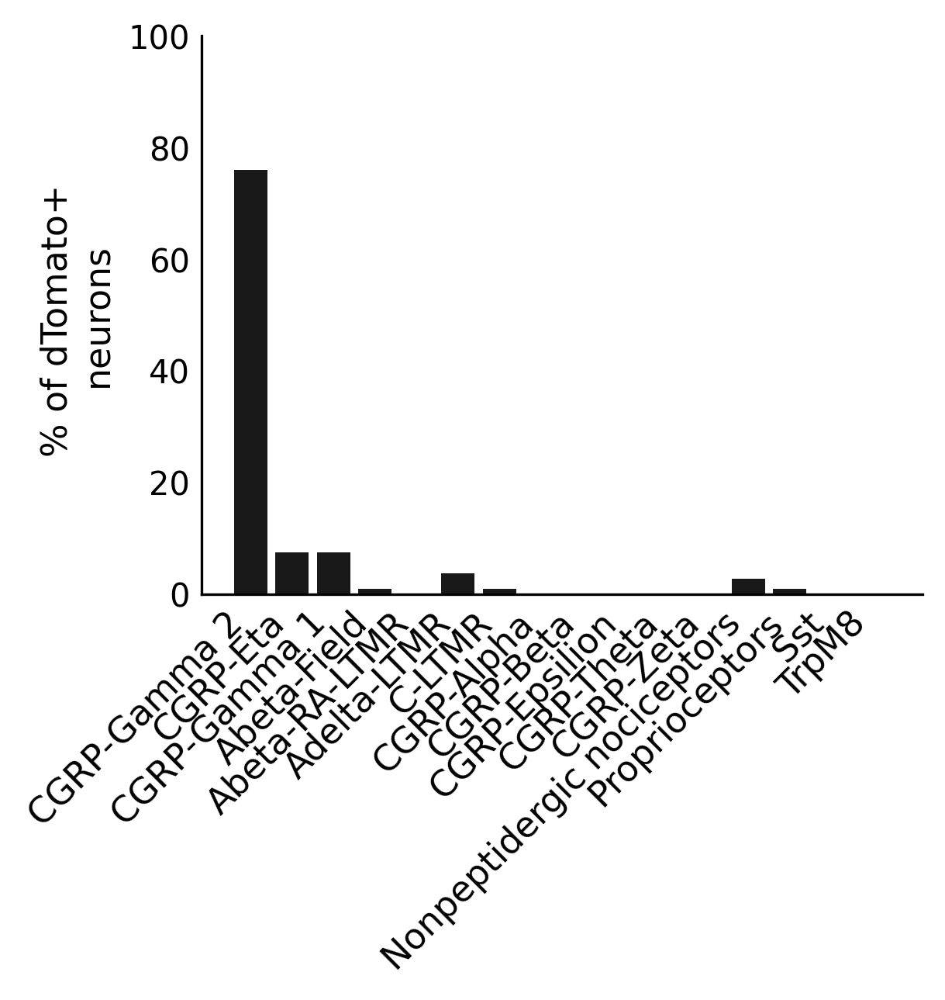

In [34]:
# use cell label ordering from dual+ counts plot above
barplot_dual_distribution(adata, population_name = 'Double+',
                          dual_col="EGFP_dTomato_dual_hi", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dual_distribution_percent.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata, population_name = 'EGFP+', 
                          dual_col="EGFP_Seq1_hi", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_percent.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata, population_name = 'dTomato+', 
                          dual_col="dTomato_Seq2_hi", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_percent.pdf"), format='pdf', bbox_inches='tight')

### Percent - showing single positive only

number +:  39
number +:  89


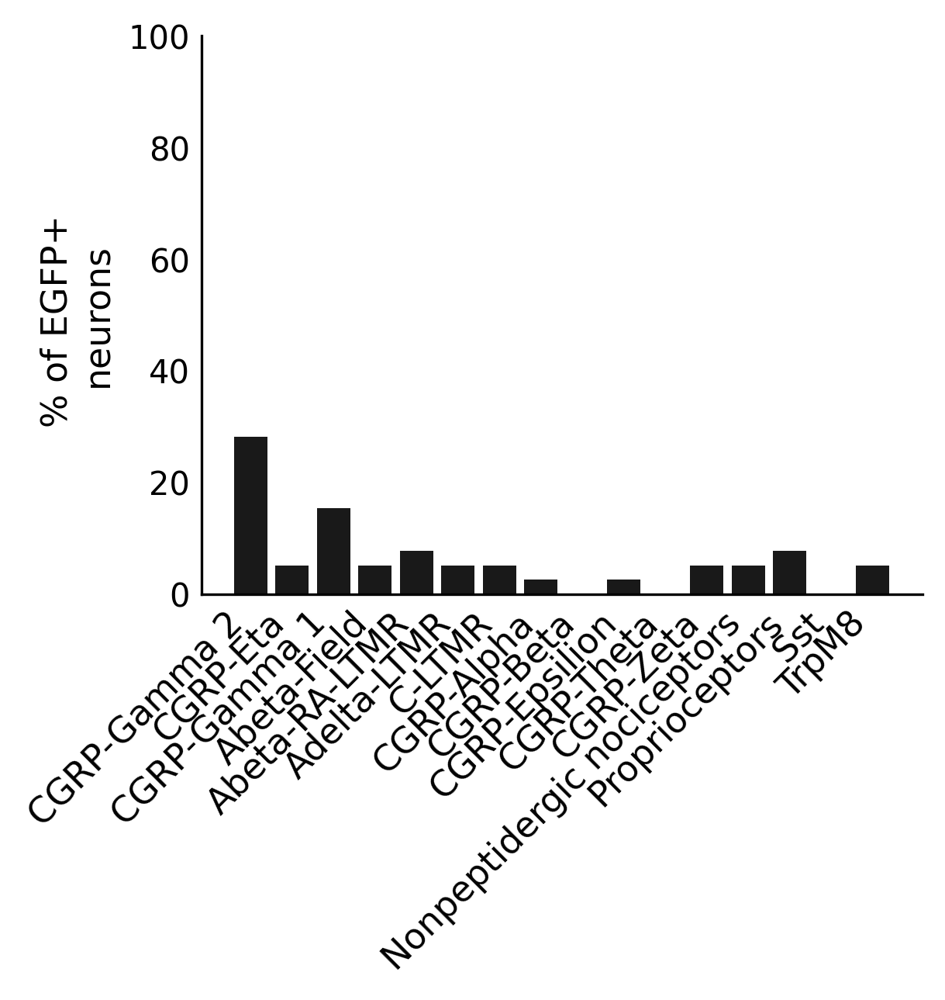

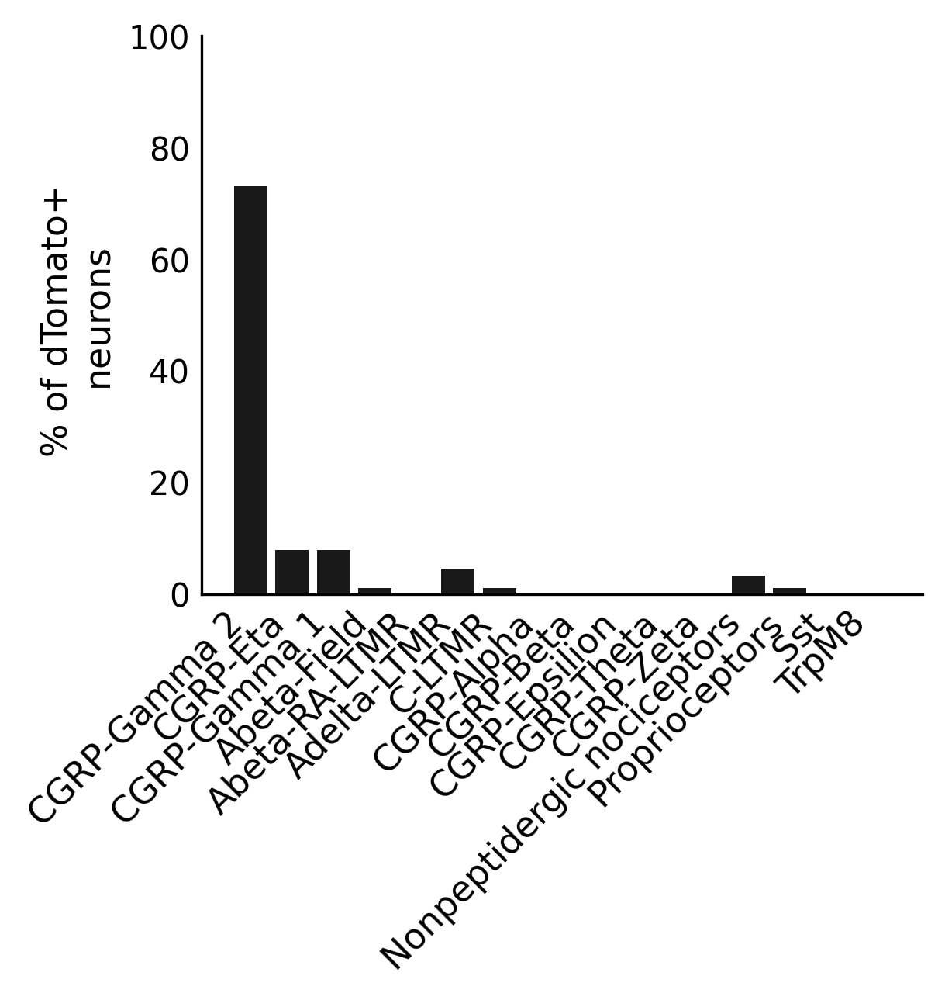

In [35]:
# set cell type order based on dual positive order

# make new temporary column 
tmp = adata.copy()
tmp.obs['EGFP_single_positive'] = False
tmp.obs['dTomato_single_positive'] = False
tmp.obs.loc[tmp.obs['reporter_status']=='EGFP_Seq1_hi', 'EGFP_single_positive'] = True
tmp.obs.loc[tmp.obs['reporter_status']=='dTomato_Seq2_hi', 'dTomato_single_positive'] = True

barplot_dual_distribution(tmp,population_name = 'EGFP+',
                          dual_col="EGFP_single_positive", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_percent_single_positive.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(tmp,population_name = 'dTomato+',
                          dual_col="dTomato_single_positive",plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_percent_single_positive.pdf"), format='pdf', bbox_inches='tight')



## Save label and reporter outputs for xenium explorer

In this adata object, the cell barcodes do not seen to have a suffix indicating the sample number. However, it looks like all indices are still unique. 

In [36]:
adata.obs.index.is_unique

True

In [37]:
adata.obs.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,...,scanvi_class,seurat_class,EGFP_Seq1_hi,dTomato_Seq2_hi,EGFP_dTomato_dual_hi,neuron_recluster_seurat,reporter_status,innervation_pattern,neuron_labels,neuron_label
aaadagcf-1,aaadagcf-1,772.174255,2206.725830,2492,0,0,0,0,0,2492.0,...,Neuron,Neuron,False,False,False,1,Negative,Negative,Nonpeptidergic nociceptors,Nonpeptidergic nociceptors
aaaihgjh-1,aaaihgjh-1,769.295227,2240.681641,4902,0,0,1,0,0,4902.0,...,Neuron,Neuron,False,False,False,6,Negative,Negative,Adelta-LTMR,Adelta-LTMR
aabcohae-1,aabcohae-1,733.544678,2249.933838,2474,0,0,0,0,0,2474.0,...,Neuron,Neuron,False,False,False,6,Negative,Negative,Adelta-LTMR,Adelta-LTMR
aabdncpn-1,aabdncpn-1,749.500977,2226.913574,2246,0,0,0,0,0,2246.0,...,Neuron,Neuron,False,False,False,11,Negative,Negative,Proprioceptors,Proprioceptors
aacblkbe-1,aacblkbe-1,723.278809,2272.222412,1497,0,0,0,0,0,1497.0,...,Neuron,Neuron,False,False,False,1,Negative,Negative,Nonpeptidergic nociceptors,Nonpeptidergic nociceptors


In [38]:
adata.obs['sample_id'].unique().tolist()

['TMA00304',
 'TMA00306',
 'TMA00313',
 'TMA00311',
 'TMA00308',
 'TMA00303',
 'TMA00310',
 'TMA00305',
 'TMA00309',
 'TMA00307',
 'TMA00312',
 'TMA00314']

In [39]:
label_cols = ["cell_id","sample_id","neuron_label","EGFP_Seq1_hi", "dTomato_Seq2_hi", "EGFP_dTomato_dual_hi", "reporter_status"]
label_df = adata.obs[label_cols]

In [40]:
# which samples contain dual+?
counts = label_df.value_counts(['sample_id', 'EGFP_dTomato_dual_hi'])
counts

sample_id  EGFP_dTomato_dual_hi
TMA00305   False                   3769
TMA00306   False                   3750
TMA00304   False                   3149
TMA00312   False                   1958
TMA00313   False                   1869
TMA00311   False                   1760
TMA00314   False                   1589
TMA00303   False                   1471
TMA00307   False                   1221
TMA00308   False                   1210
TMA00309   False                    325
TMA00310   False                    321
TMA00306   True                       5
TMA00305   True                       5
TMA00310   True                       2
TMA00312   True                       2
TMA00304   True                       2
TMA00307   True                       1
TMA00311   True                       1
TMA00313   True                       1
Name: count, dtype: int64

In [41]:
label_df.head()

,cell_id,sample_id,neuron_label,EGFP_Seq1_hi,dTomato_Seq2_hi,EGFP_dTomato_dual_hi,reporter_status
aaadagcf-1,aaadagcf-1,TMA00304,Nonpeptidergic nociceptors,False,False,False,Negative
aaaihgjh-1,aaaihgjh-1,TMA00304,Adelta-LTMR,False,False,False,Negative
aabcohae-1,aabcohae-1,TMA00304,Adelta-LTMR,False,False,False,Negative
aabdncpn-1,aabdncpn-1,TMA00304,Proprioceptors,False,False,False,Negative
aacblkbe-1,aacblkbe-1,TMA00304,Nonpeptidergic nociceptors,False,False,False,Negative


In [42]:
label_df['neuron_label'].unique().tolist()

['Nonpeptidergic nociceptors',
 'Adelta-LTMR',
 'Proprioceptors',
 'CGRP-Eta',
 'C-LTMR',
 'CGRP-Gamma 2',
 'Abeta-RA-LTMR',
 'CGRP-Gamma 1',
 'CGRP-Zeta',
 'CGRP-Theta',
 'TrpM8',
 'CGRP-Epsilion',
 'Abeta-Field',
 'CGRP-Alpha',
 'CGRP-Beta',
 'Sst']

### Output csvs with neuron label

In [43]:
# for Xenium explorer, can only have one group
label_df_neuron_label = label_df.copy()
label_df_neuron_label['group'] = label_df_neuron_label['neuron_label']

# split to individual samples
for sample in adata.obs['sample_id'].unique().tolist():
    label_df_sample = label_df_neuron_label[label_df_neuron_label['sample_id']==sample]
    # save to csv 
    label_df_sample.to_csv(os.path.join(output_dir, f"label_df_{sample}_neuron_label.csv"),index=False)

### Output csvs with reporter status

In [44]:
# for Xenium explorer, can only have one group
label_df_reporter = label_df.copy()
label_df_reporter['group'] = label_df_reporter['reporter_status']

# split to individual samples
for sample in adata.obs['sample_id'].unique().tolist():
    label_df_sample = label_df_reporter[label_df_reporter['sample_id']==sample]
    # save to csv 
    label_df_sample.to_csv(os.path.join(output_dir, f"label_df_{sample}_reporter.csv"),index=False)

## Subcluster CGRP gamma 

- Re-running MC subclustering code and saving updated visualizations
- Confirming I get the same plot results as MC

In [36]:
# 1. Subset to the CGRP-Gamma population
gamma_adata = adata[adata.obs['seurat_labels'] == 'CGRP-Gamma'].copy()

# 2. Use scVI latent space instead of PCA for neighbors
sc.pp.neighbors(gamma_adata, use_rep='X_scVI_seurat_neuron')
sc.tl.umap(gamma_adata)
sc.tl.leiden(gamma_adata, resolution=0.1, key_added='gamma_subclusters')

# 3. Identify G1 vs G2 based on Chrna3 mean expression
# Temporarily pull gene expression into .obs to allow grouping
gamma_adata.obs['Chrna3_temp'] = gamma_adata[:, 'Chrna3'].X.toarray().flatten()

cluster_expr = gamma_adata.obs.groupby('gamma_subclusters', observed=False)['Chrna3_temp'].mean()
g2_cluster = cluster_expr.idxmax()
g1_cluster = cluster_expr.idxmin()

/home/workspace/environment/sc-scvi/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_109/1444506293.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(gamma_adata, resolution=0.1, key_added='gamma_subclusters')


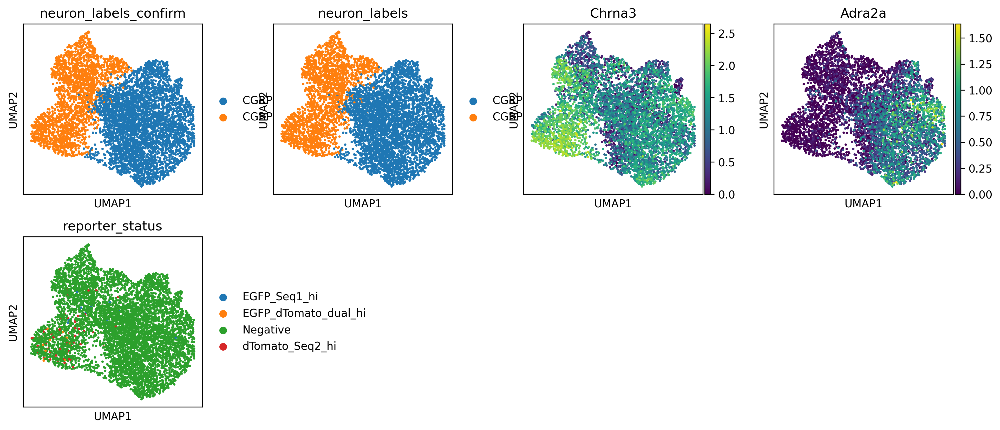

In [37]:
# Clean up the temporary column to avoid plotting conflicts
del gamma_adata.obs['Chrna3_temp']

# 4. Create the final labels
label_map = {g1_cluster: 'CGRP-Gamma 1', g2_cluster: 'CGRP-Gamma 2'}
gamma_adata.obs['neuron_labels_confirm'] = gamma_adata.obs['gamma_subclusters'].map(label_map)

# 5. Visualize to confirm the split
sc.pl.umap(gamma_adata, color=['neuron_labels_confirm', 'neuron_labels', 'Chrna3', 'Adra2a', 'reporter_status'])

### Save CGRP visualizations

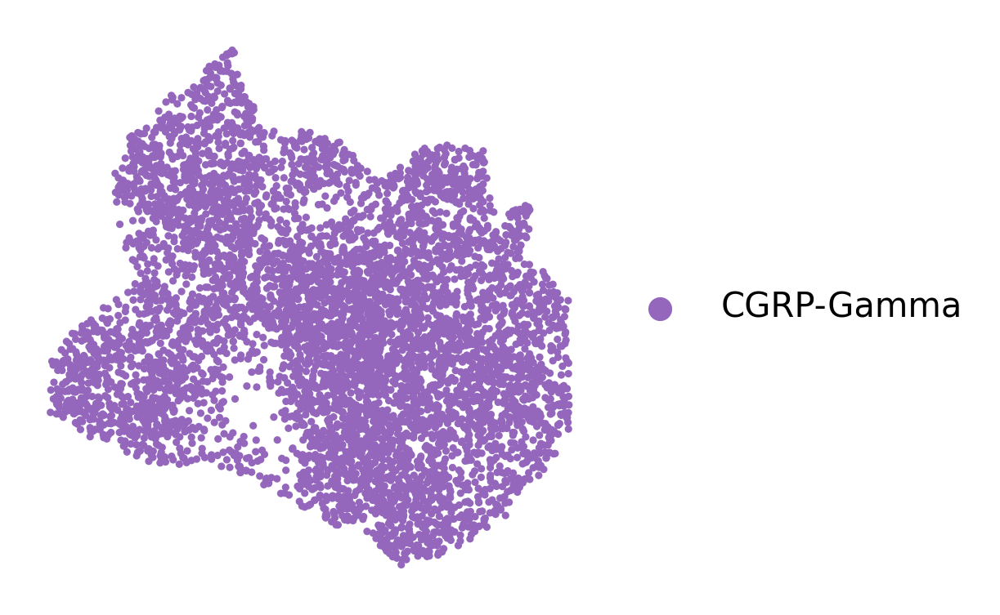

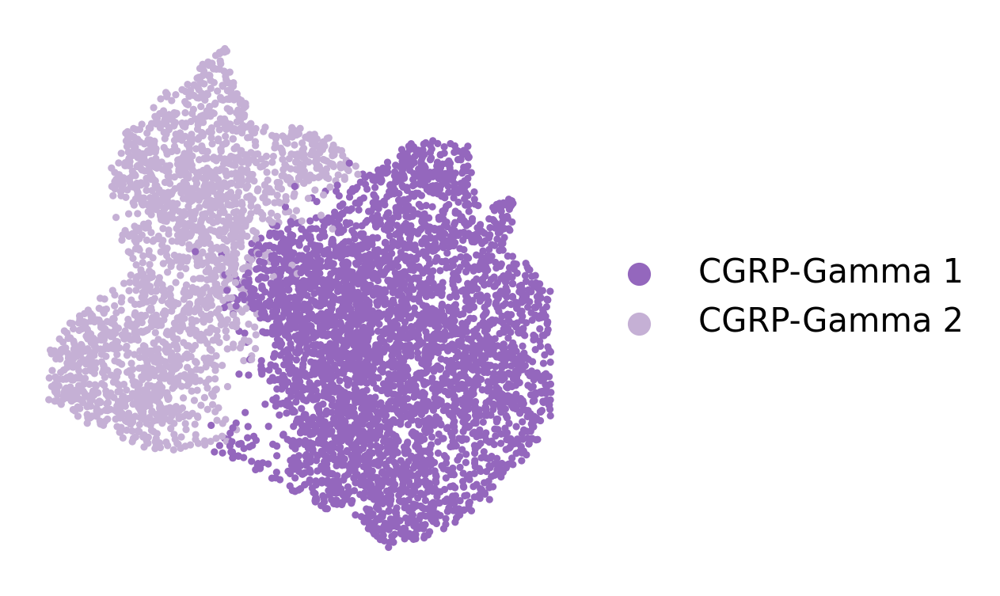

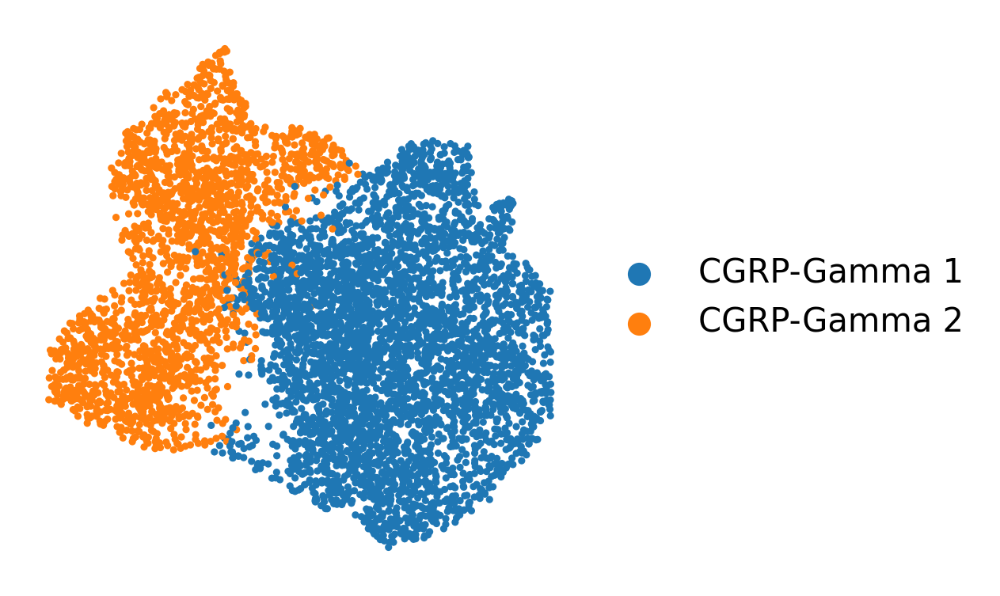

In [53]:
sc.pl.umap(gamma_adata, color='seurat_labels', frameon = False, title = '', show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_umap_all.pdf"), format='pdf', bbox_inches='tight')

sc.pl.umap(gamma_adata, color='neuron_label', frameon = False, title = '', show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_neuron_label.pdf"), format='pdf', bbox_inches='tight')

sc.pl.umap(gamma_adata, color='neuron_label', frameon = False, title = '', palette = ['#1f77b4', '#ff7f0e'], show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_neuron_label_blue_orange.pdf"), format='pdf', bbox_inches='tight')



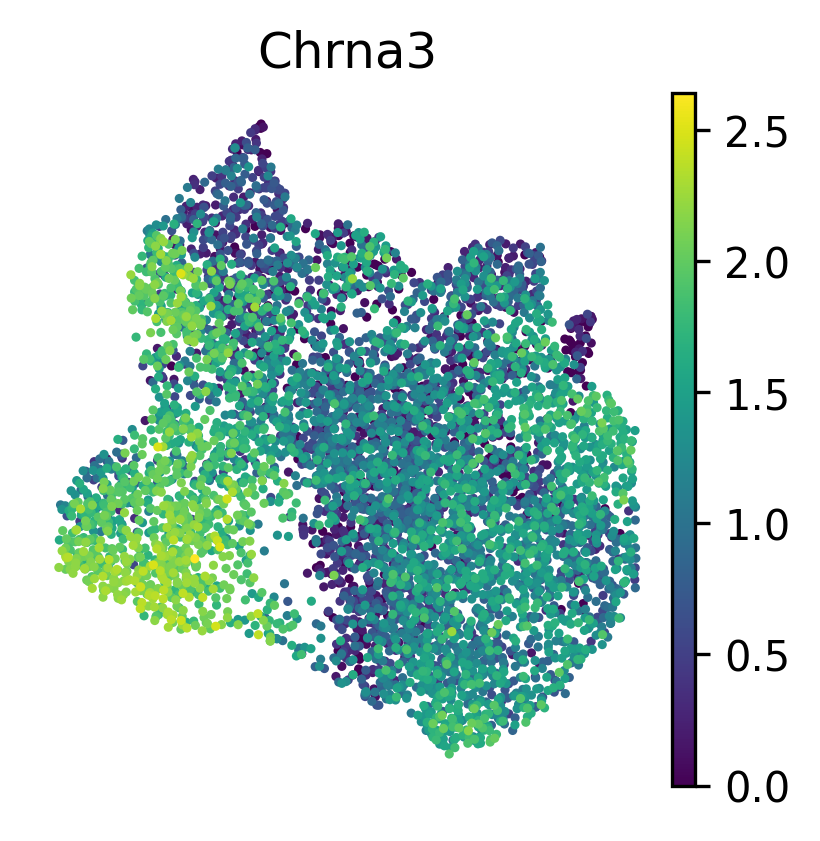

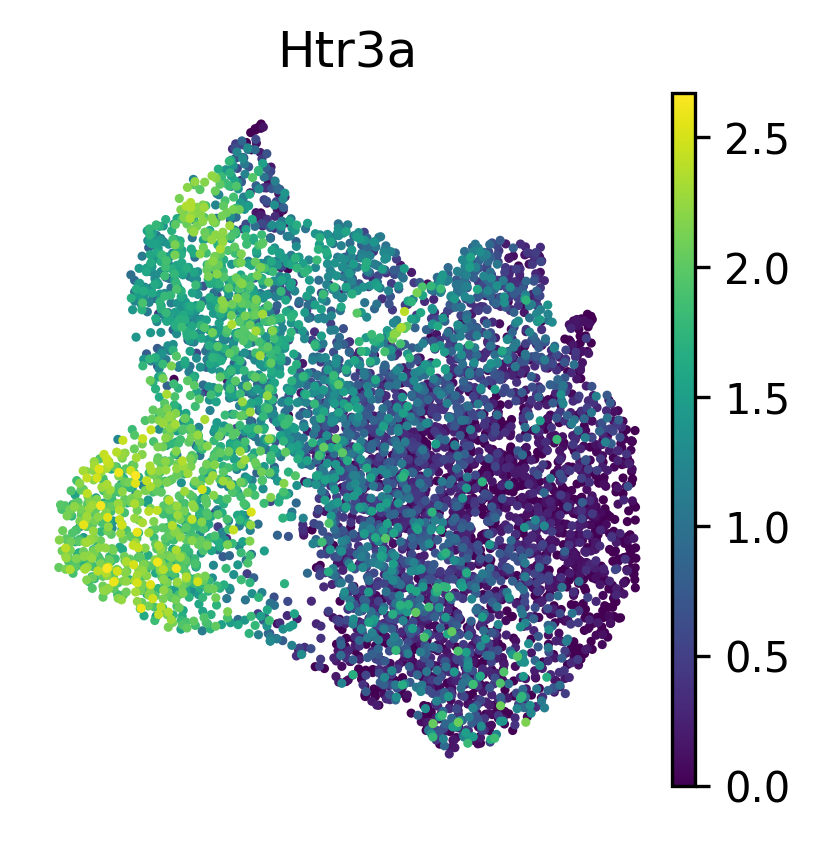

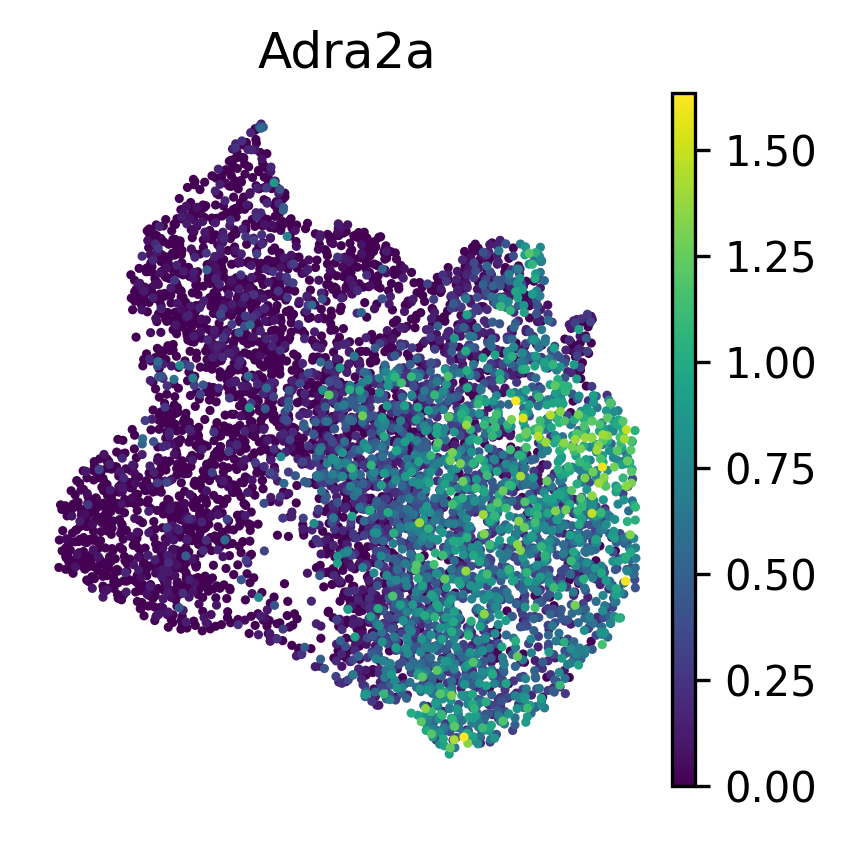

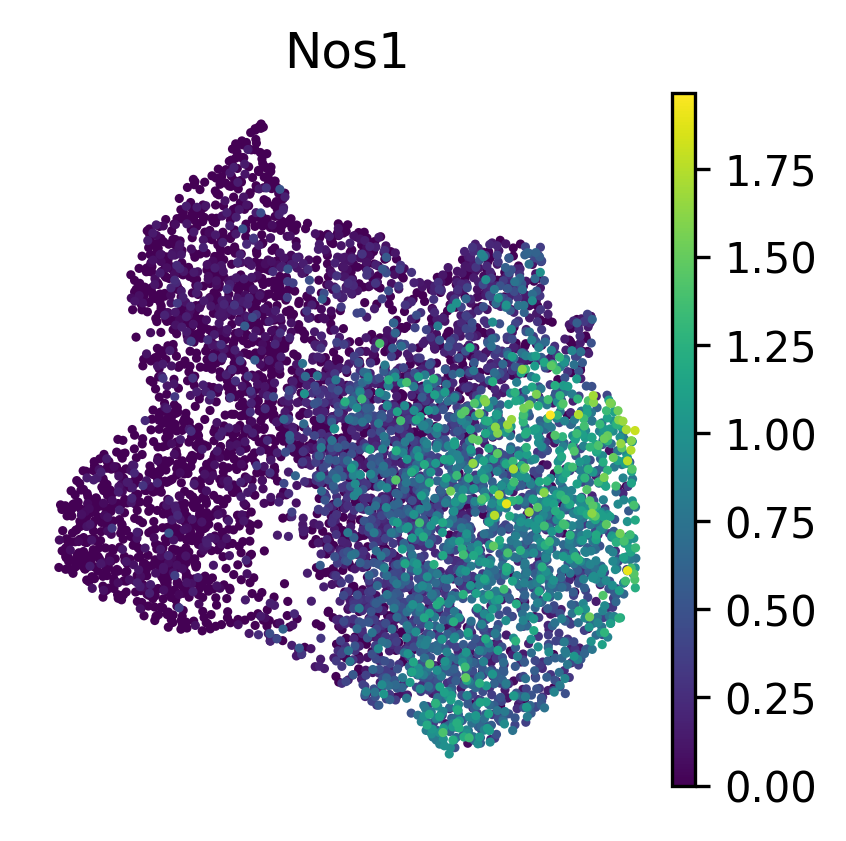

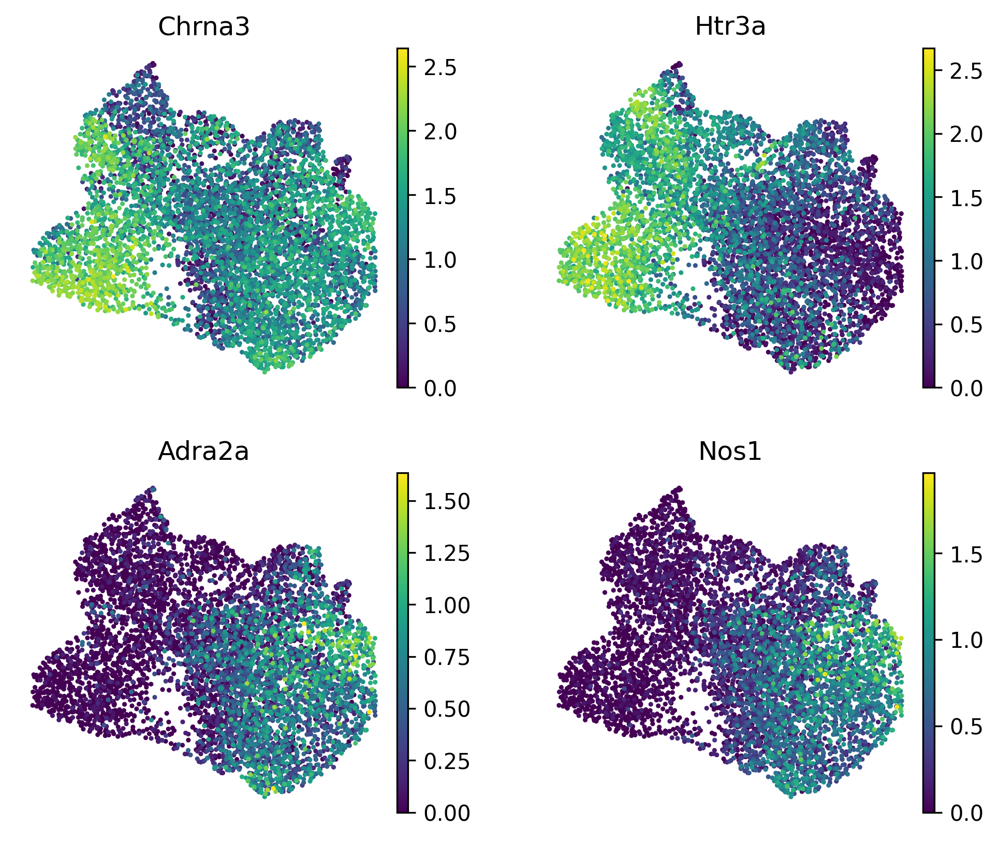

In [54]:
sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Chrna3', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_Chrna3.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Htr3a', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_Htr3a.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Adra2a', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_Adra2a.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Nos1', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_Nos1.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color=['Chrna3','Htr3a','Adra2a','Nos1'], ncols = 2, frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_all4genes.pdf"), format='pdf', bbox_inches='tight')

## Check kde plots

In [115]:
def kde_grid_plot(
    adata,
    genes,
    group_col="EGFP_dTomato_dual_hi",   # group column to compare True vs False
    ncols=5,                             # number of columns in grid
    figsize=(12, 6),
    gene_fontsize=14                     # NEW: control gene title size
):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    import pandas as pd
    import math

    sns.set_theme(style="ticks")

    # --- Robust conversion of group_col to boolean ---
    raw_group = adata.obs[group_col]

    if isinstance(raw_group.dtype, pd.CategoricalDtype):
        group_bool = raw_group.astype(str) == "True"
    elif raw_group.dtype == bool:
        group_bool = raw_group.values
    else:
        group_bool = raw_group.astype(str).str.lower().isin(["true", "1", "yes"]).values

    # Extract expression values for each gene
    df = adata.to_df()[genes]

    n = len(genes)
    nrows = math.ceil(n / ncols)

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=figsize,
        sharex=False,
        sharey=False
    )

    axes = axes.flatten()

    for i, gene in enumerate(genes):
        ax = axes[i]
        x = df[gene].values

        # KDE for False (black)
        sns.kdeplot(
            x[~group_bool],
            ax=ax,
            fill=True,
            color="black",
            alpha=0.25,
            linewidth=3,
            label="False"
        )

        # KDE for True (blue)
        sns.kdeplot(
            x[group_bool],
            ax=ax,
            fill=True,
            color="blue",
            alpha=0.5,
            linewidth=2,
            label="True"
        )

        # --- Italicized, configurable gene name ---
        ax.set_title(
            f"$\\it{{{gene}}}$",
            fontsize=gene_fontsize
        )

        # ax.set_yticks([])
        ax.set_ylabel("")
        ax.tick_params(axis="x", labelsize=8)

    # Hide unused axes (if any)
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    sns.despine()
    plt.tight_layout()

    return fig

### Main figure i

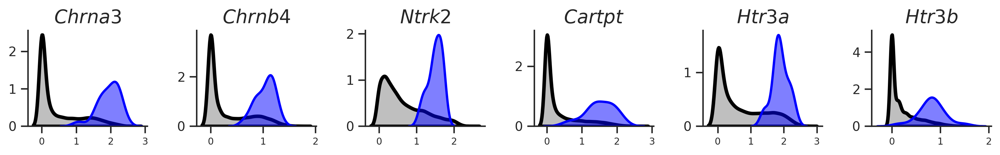

In [149]:
genes = ['Chrna3', 'Chrnb4', 'Ntrk2', 'Cartpt', 'Htr3a', 'Htr3b']
fig = kde_grid_plot(
    adata,
    genes=genes,
    group_col="EGFP_dTomato_dual_hi",
    ncols=6,
    figsize=(12, 2),
    gene_fontsize = 16
)
plt.savefig(os.path.join(plot_out_dir, "dual_postive_comparison_allneurons.pdf"), format='pdf', bbox_inches='tight')

### Extended Data Fig g

Here the comparsion should be between the double positive CGRP cells and all other CGRP-gamma. So I assume MC first just subsetted to the CGRPg

In [109]:
adata.obs['neuron_labels'].unique().tolist()

['Nonpeptidergic nociceptors',
 'Adelta-LTMR',
 'Proprioceptors',
 'CGRP-Eta',
 'C-LTMR',
 'CGRP-Gamma 2',
 'Abeta-RA-LTMR',
 'CGRP-Gamma 1',
 'CGRP-Zeta',
 'CGRP-Theta',
 'TrpM8',
 'CGRP-Epsilion',
 'Abeta-Field',
 'CGRP-Alpha',
 'CGRP-Beta',
 'Sst']

In [110]:
adata_CGRPg = adata[adata.obs['neuron_labels'].isin(['CGRP-Gamma 1', 'CGRP-Gamma 2']), :].copy()
adata_CGRPg.shape

(6186, 475)

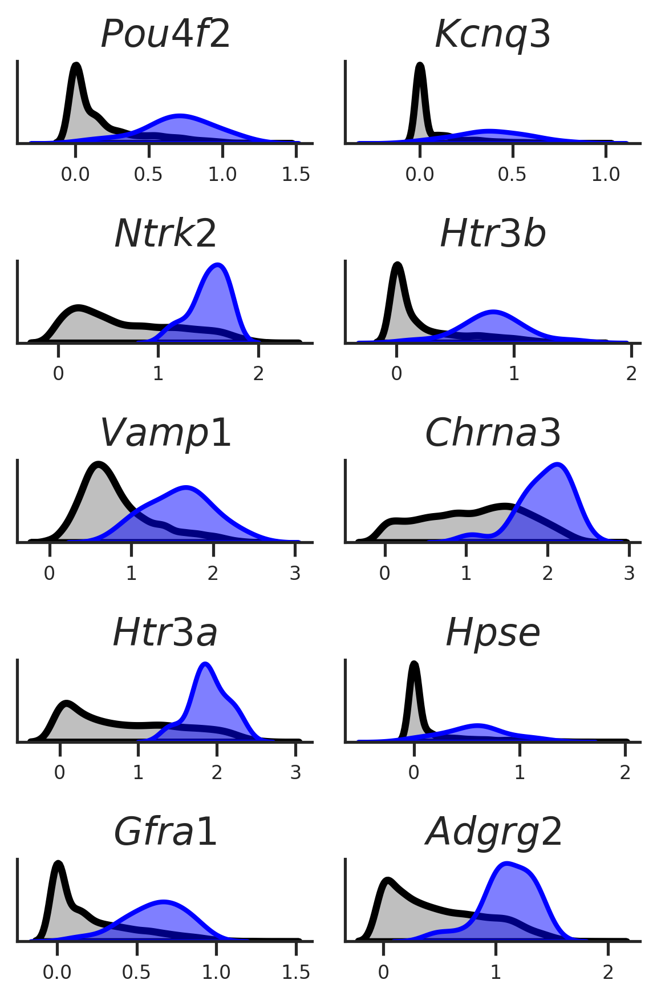

In [114]:
genes = ['Pou4f2', 'Kcnq3', 'Ntrk2', 'Htr3b', 'Vamp1', 'Chrna3', 'Htr3a', 'Hpse', 'Gfra1', 'Adgrg2']
fig = kde_grid_plot(
    adata_CGRPg,
    genes=genes,
    group_col="EGFP_dTomato_dual_hi",
    ncols=2,
    figsize=(4,6),
    gene_fontsize = 16
)
plt.savefig(os.path.join(plot_out_dir, "dual_postive_comparison_CGRPgamma.pdf"), format='pdf', bbox_inches='tight')

## Test area filtering - does is remove AB single positive cells? 


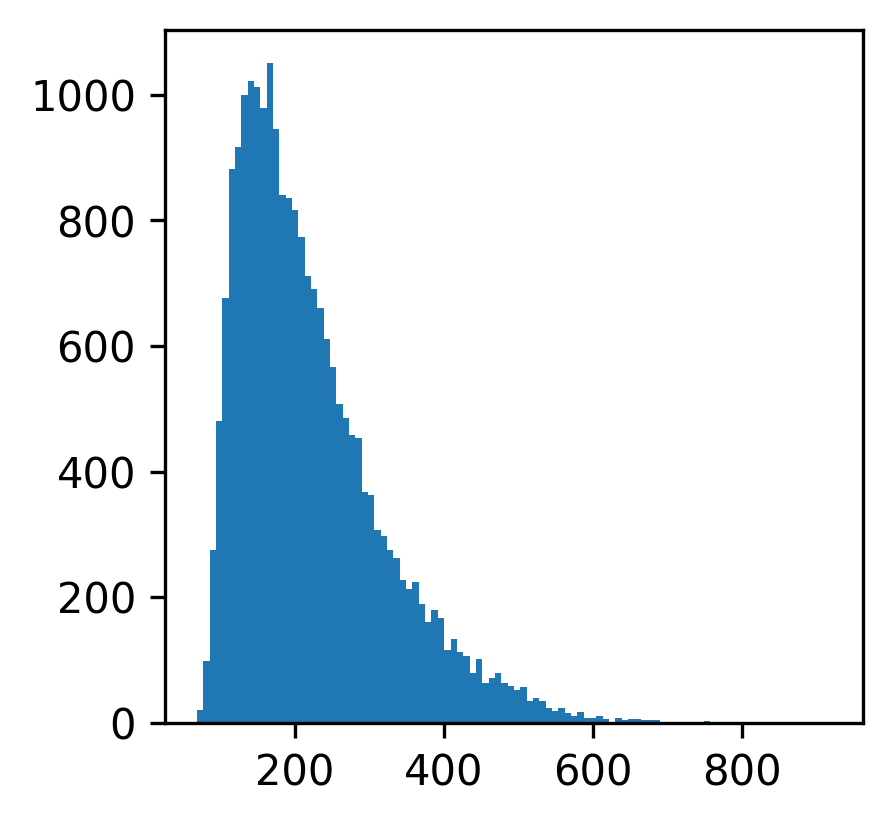

In [53]:
plt.hist(adata.obs['cell_area'], bins = 100); plt.show()

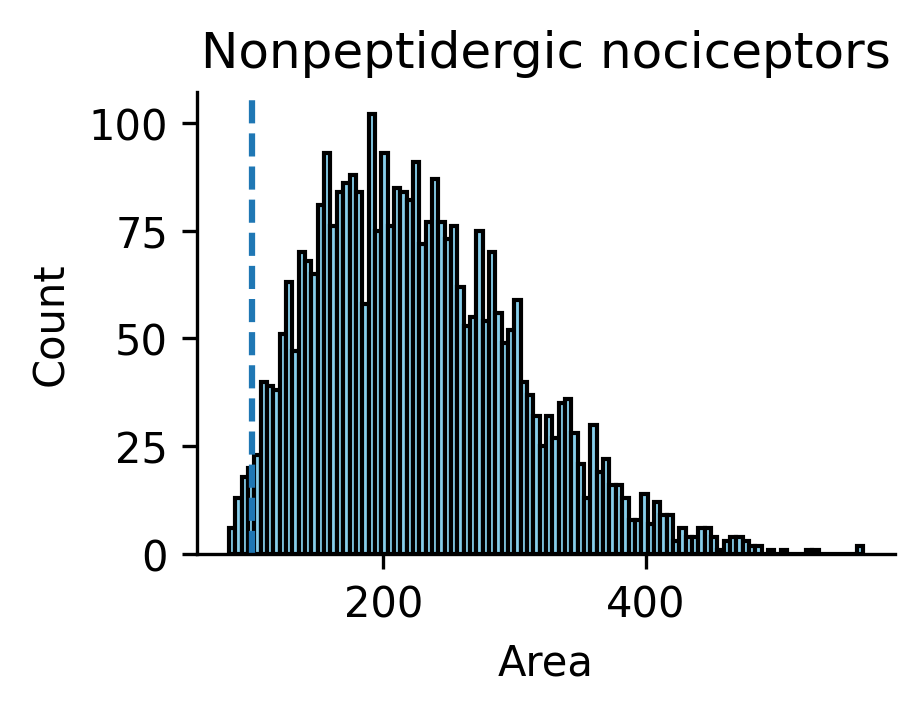

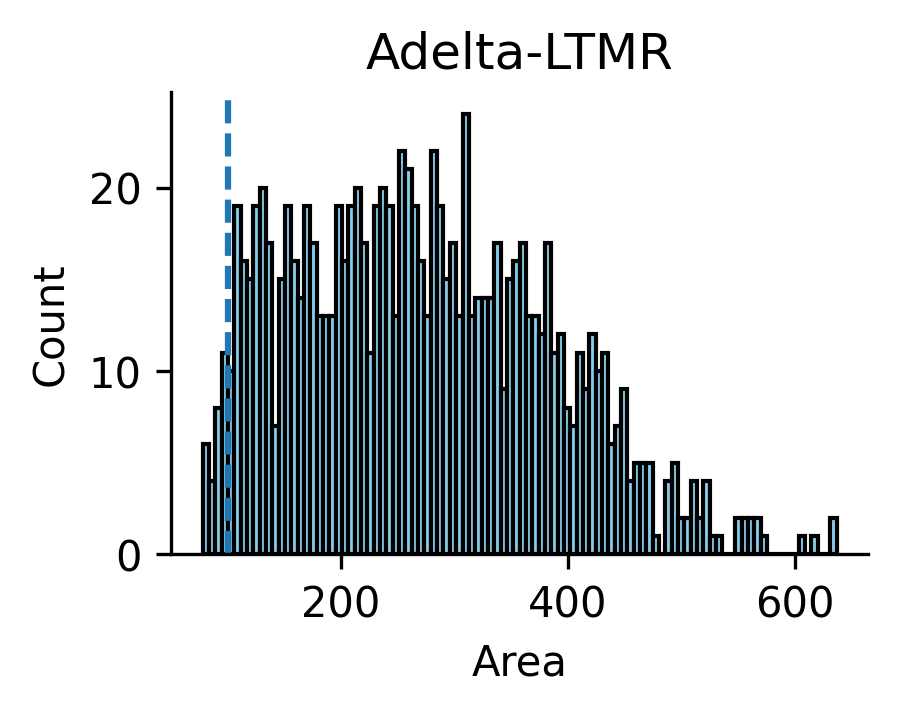

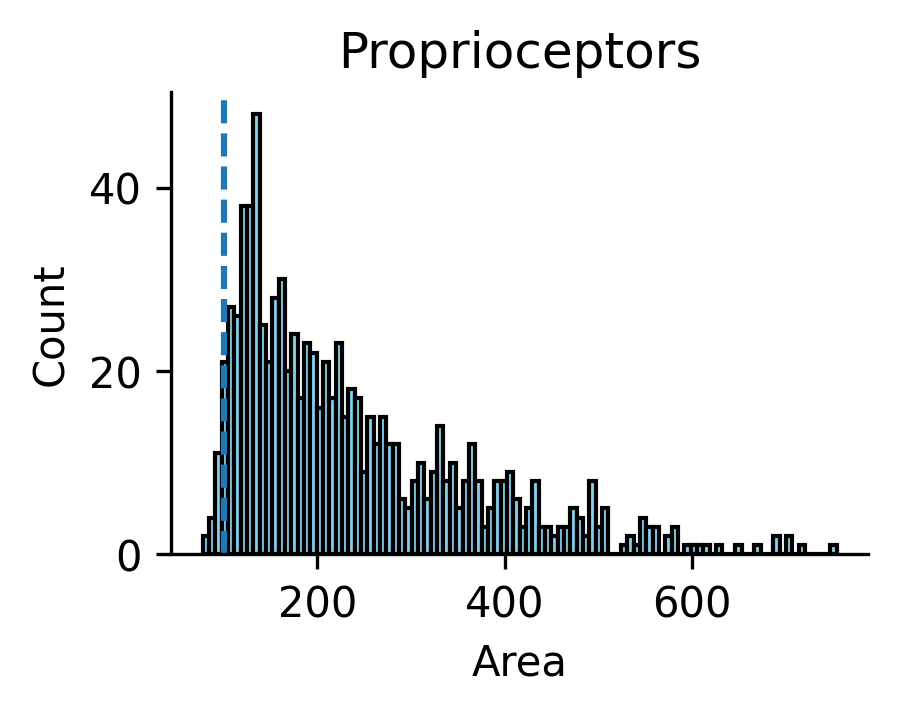

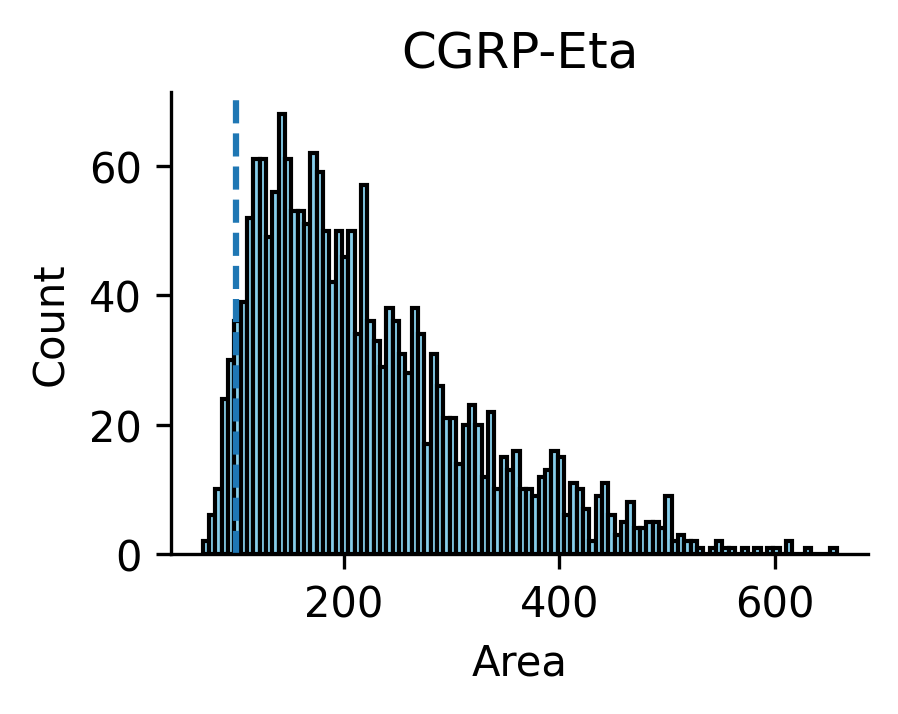

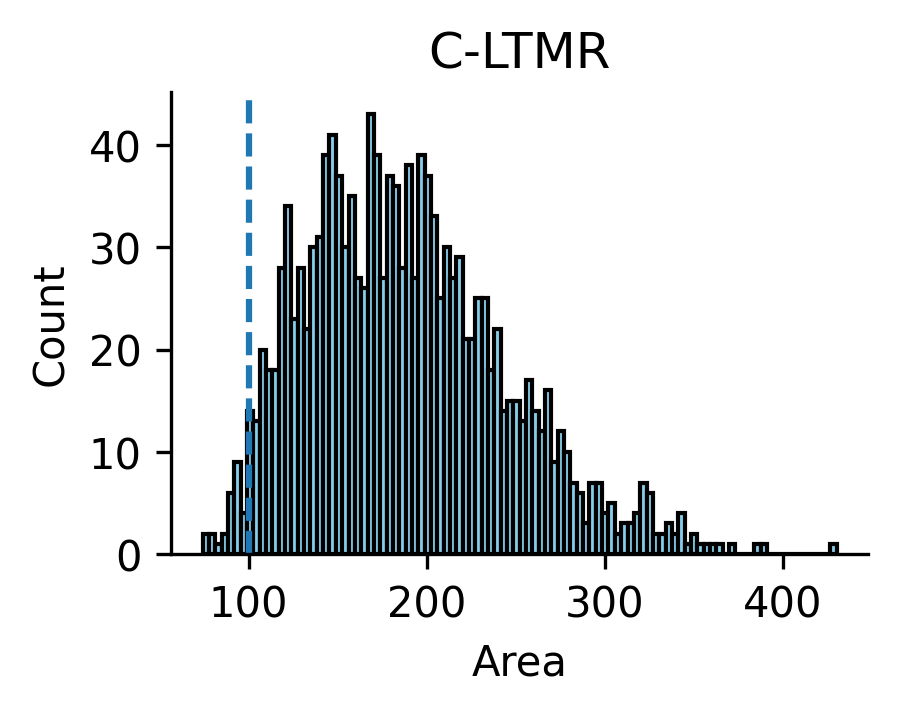

...

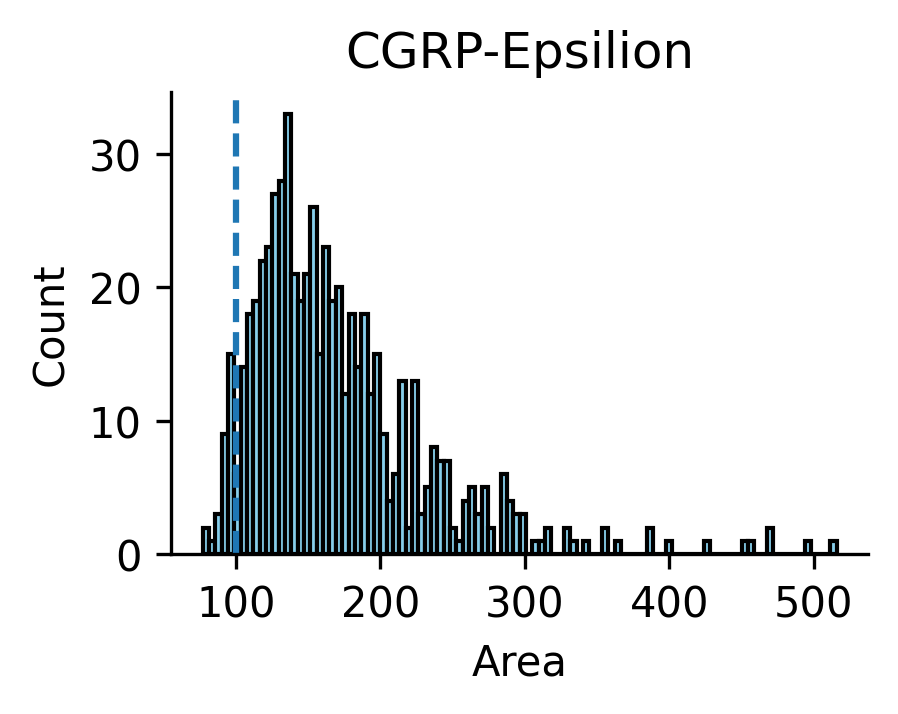

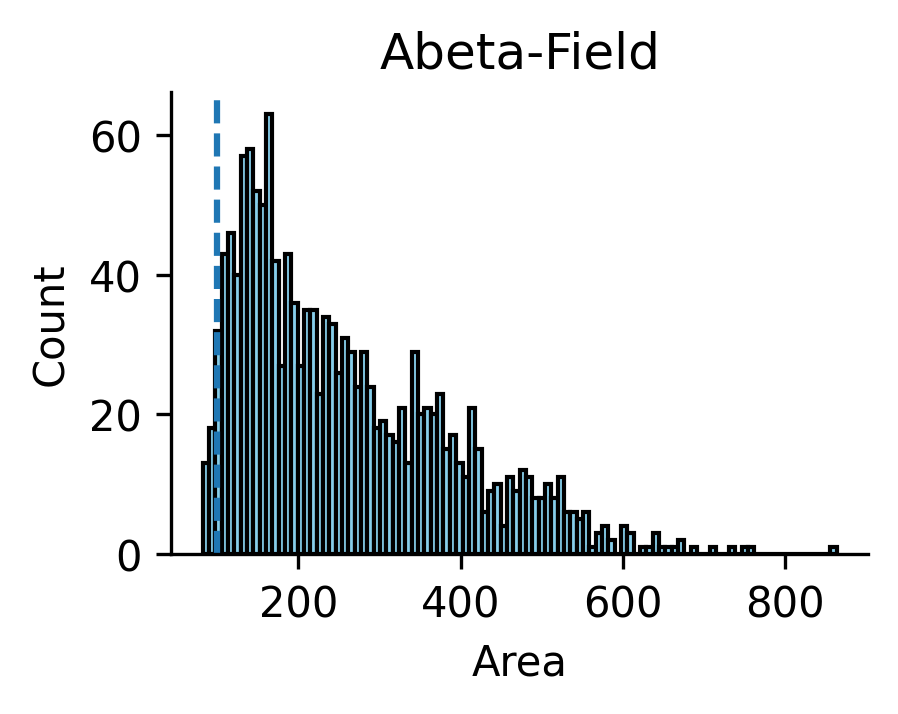

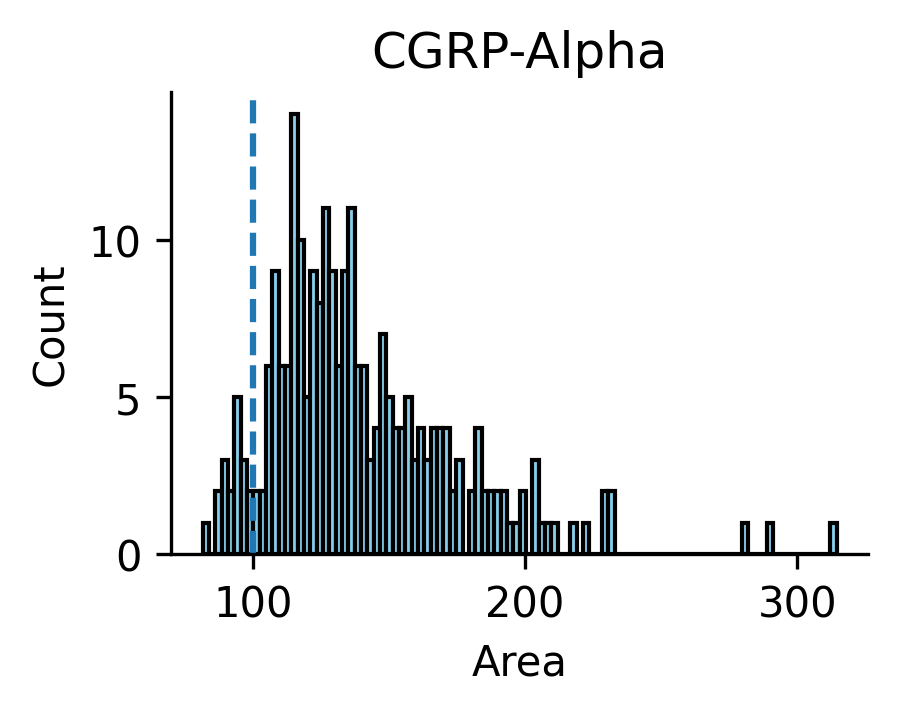

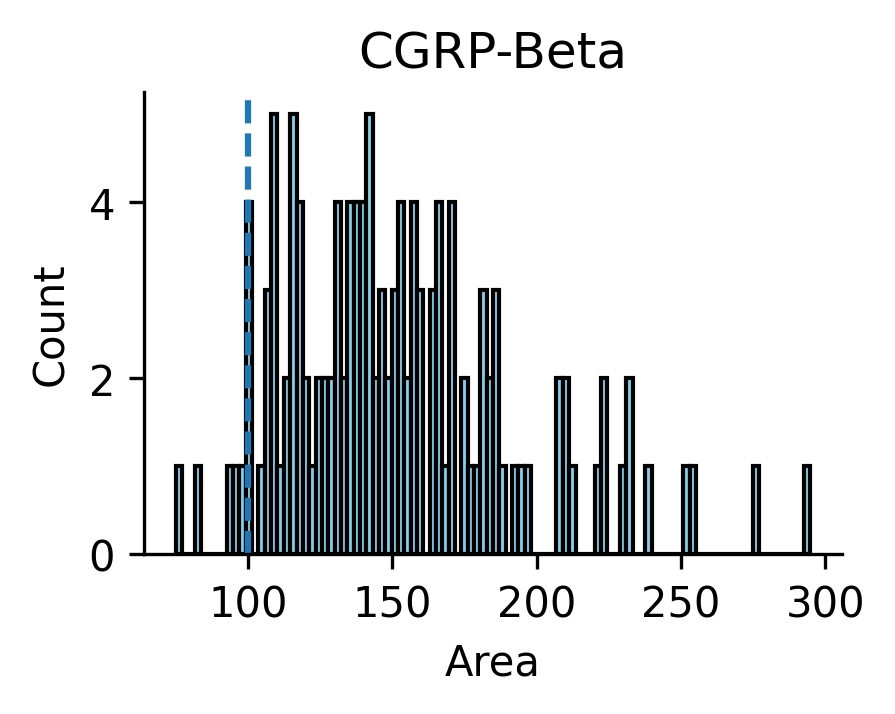

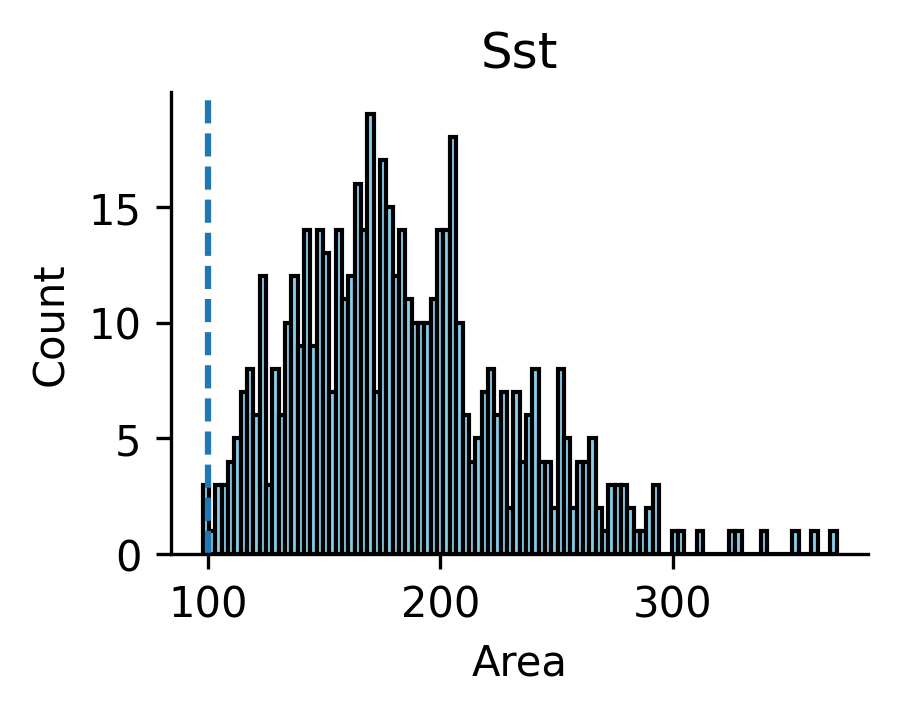

In [61]:
group_col = 'neuron_label'
areas = adata.obs[['cell_area', group_col]].copy()
areas[group_col] = areas[group_col].astype(str).replace("nan", "Unknown")

# Loop through each unique neuron type
for label in areas[group_col].unique():
    subset = areas[areas[group_col] == label]
    
    plt.figure(figsize=(3, 2))
    plt.hist(subset['cell_area'], bins=100, color='skyblue', edgecolor='black')
    plt.axvline(100, linestyle = '--')
    plt.title(f"{label}")
    plt.xlabel("Area")
    plt.ylabel("Count")
    sns.despine()
    plt.show()

In [63]:
min_area = 75
adata_area_filter = adata[adata.obs['cell_area']>min_area, :].copy()
print(adata.shape)
print(adata_area_filter.shape)

(22411, 475)
(22399, 475)


In [64]:
group_col = 'neuron_label'
dual_col = 'EGFP_Seq1_hi'
# output 
df = adata_area_filter.obs[[group_col, dual_col]].copy()
df[dual_col] = df[dual_col].astype(bool)
df[group_col] = df[group_col].astype(str).replace("nan", "Unknown")

# Count dual positives per group (correct)
dual_counts = df.groupby(group_col)[dual_col].sum()

total_dual = dual_counts.sum()
print('number +: ', total_dual)

# percentage
stats = (dual_counts / total_dual * 100).sort_values(ascending=False)

count_percent_df = pd.concat([dual_counts, stats], axis=1)
count_percent_df.columns = ['count', 'percent']
count_percent_df = count_percent_df.sort_values(by='percent', ascending=False)
count_percent_df

number +:  58


,count,percent
neuron_label,,
CGRP-Gamma 2,28,48.275862
CGRP-Gamma 1,7,12.068966
Abeta-RA-LTMR,3,5.172414
CGRP-Eta,3,5.172414
Proprioceptors,3,5.172414
Abeta-Field,2,3.448276
Adelta-LTMR,2,3.448276
C-LTMR,2,3.448276
CGRP-Zeta,2,3.448276
